<a href="https://colab.research.google.com/github/Faith927/Machine-Learning-A2/blob/main/A2_TrafficSigns_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Google Drive
* Connect to google drive
* Unzip Files

In [1]:
import tensorflow as tf
print(tf.__version__)

2.15.0


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!ls /content/drive/'My Drive'/COSC2673A2/

 A2-TrafficSigns.ipynb	 images			       model	     Testing.zip
 Classes		'Machine Learning - A2.gdoc'   smote_VGG_3   trafficsigns_dataset.zip


In [4]:
!cp /content/drive/'My Drive'/COSC2673A2/trafficsigns_dataset.zip .
!unzip -q -o trafficsigns_dataset.zip
!rm trafficsigns_dataset.zip
!ls


drive  __MACOSX  sample_data  trafficsigns_dataset


In [5]:
!cp /content/drive/'My Drive'/COSC2673A2/Testing.zip .
!unzip -q -o Testing.zip
!rm Testing.zip
!ls

drive  __MACOSX  sample_data  Testing  trafficsigns_dataset


#EDA
* create dataframe from files
* visualize number of images per class
* analyze random sample images

In [197]:
# Standard library imports
import os
import re
import glob
import hashlib
from pathlib import Path
import random
import argparse

# Data manipulation and analysis
import pandas as pd
import numpy as np

# Image processing
from PIL import Image, ImageOps
import cv2
from skimage import transform, exposure, io

# Data visualization
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns

# Machine learning and deep learning
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, precision_score, recall_score, f1_score
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import BatchNormalization, Conv2D, MaxPooling2D, Activation, Flatten, Dropout, Dense
from tensorflow.keras import regularizers, datasets, layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
import keras.backend as K
from tensorflow.keras import regularizers
from keras.callbacks import LearningRateScheduler

# Jupyter display utilities
from IPython.display import display


In [7]:
dataset_folder = 'trafficsigns_dataset'

# List subfolders in dataset folder
subfolders = [subfolder for subfolder in os.listdir(dataset_folder) if os.path.isdir(os.path.join(dataset_folder, subfolder))]

# Iterate over subfolders
for subfolder in subfolders:
    subfolder_path = os.path.join(dataset_folder, subfolder)
    print(f"Subfolder: {subfolder}")

    # List files in current subfolder
    files = os.listdir(subfolder_path)

    # Print files in current subfolder
    for file in files:
        print(f"  - {file}")


Subfolder: round
  - noparking
  - traveldirection
  - limitedtraffic
  - .DS_Store
  - speed
  - trafficdirective
  - roundabout
  - bicycle
  - noentry
Subfolder: square
  - parking
  - .DS_Store
  - laneend
  - continue
  - crossing
Subfolder: diamond
  - rightofway
Subfolder: triangle
  - giveway
  - warning
Subfolder: hex
  - stop


In [8]:
dataset_folder = 'trafficsigns_dataset'
subfolders = ['hex', 'triangle', 'diamond', 'square', 'round']

data = []
subfolder_variables = {}

# Iterate over the main subfolders
for label in subfolders:
    subfolder_path = Path(dataset_folder) / label

    # Initialize empty dictionary for sub-subfolders
    subfolder_variables[label] = {}

    # Iterate over sub-subfolders
    for sub_label in subfolder_path.iterdir():
        if sub_label.is_dir():
            images = [file for file in sub_label.iterdir() if file.suffix == '.png']
            subfolder_variables[label][sub_label.name] = images

            # Append image name and label to list
            data.extend({'image name': str(image), 'label': f"{label}/{sub_label.name}"} for image in images)

df = pd.DataFrame(data)
print(df.head())


                                      image name     label
0  trafficsigns_dataset/hex/stop/00684_00001.png  hex/stop
1  trafficsigns_dataset/hex/stop/00684_00000.png  hex/stop
2  trafficsigns_dataset/hex/stop/01258_00000.png  hex/stop
3  trafficsigns_dataset/hex/stop/00375_00000.png  hex/stop
4  trafficsigns_dataset/hex/stop/01258_00002.png  hex/stop


In [9]:
df_train = df.copy()
df_train

,image name,label
0,trafficsigns_dataset/hex/stop/00684_00001.png,hex/stop
1,trafficsigns_dataset/hex/stop/00684_00000.png,hex/stop
2,trafficsigns_dataset/hex/stop/01258_00000.png,hex/stop
3,trafficsigns_dataset/hex/stop/00375_00000.png,hex/stop
4,trafficsigns_dataset/hex/stop/01258_00002.png,hex/stop
...,...,...
3694,trafficsigns_dataset/round/noentry/01636_00000...,round/noentry
3695,trafficsigns_dataset/round/noentry/00048_00002...,round/noentry
3696,trafficsigns_dataset/round/noentry/01054_00002...,round/noentry
3697,trafficsigns_dataset/round/noentry/01289_00000...,round/noentry


In [10]:

df_train[['shape','type']] = df_train['label'].str.split("/",expand=True)
df_train = df_train.drop('label',axis=1)
df_train

,image name,shape,type
0,trafficsigns_dataset/hex/stop/00684_00001.png,hex,stop
1,trafficsigns_dataset/hex/stop/00684_00000.png,hex,stop
2,trafficsigns_dataset/hex/stop/01258_00000.png,hex,stop
3,trafficsigns_dataset/hex/stop/00375_00000.png,hex,stop
4,trafficsigns_dataset/hex/stop/01258_00002.png,hex,stop
...,...,...,...
3694,trafficsigns_dataset/round/noentry/01636_00000...,round,noentry
3695,trafficsigns_dataset/round/noentry/00048_00002...,round,noentry
3696,trafficsigns_dataset/round/noentry/01054_00002...,round,noentry
3697,trafficsigns_dataset/round/noentry/01289_00000...,round,noentry


In [11]:
shape_counts = df_train['shape'].value_counts()
type_counts = df_train['type'].value_counts()
print(shape_counts)
print(type_counts)

shape
round       1760
triangle     926
square       688
diamond      282
hex           43
Name: count, dtype: int64
type
warning             695
noentry             375
speed               316
bicycle             285
rightofway          282
parking             276
noparking           242
giveway             231
continue            199
trafficdirective    195
limitedtraffic      125
traveldirection     124
laneend             118
roundabout           98
crossing             95
stop                 43
Name: count, dtype: int64


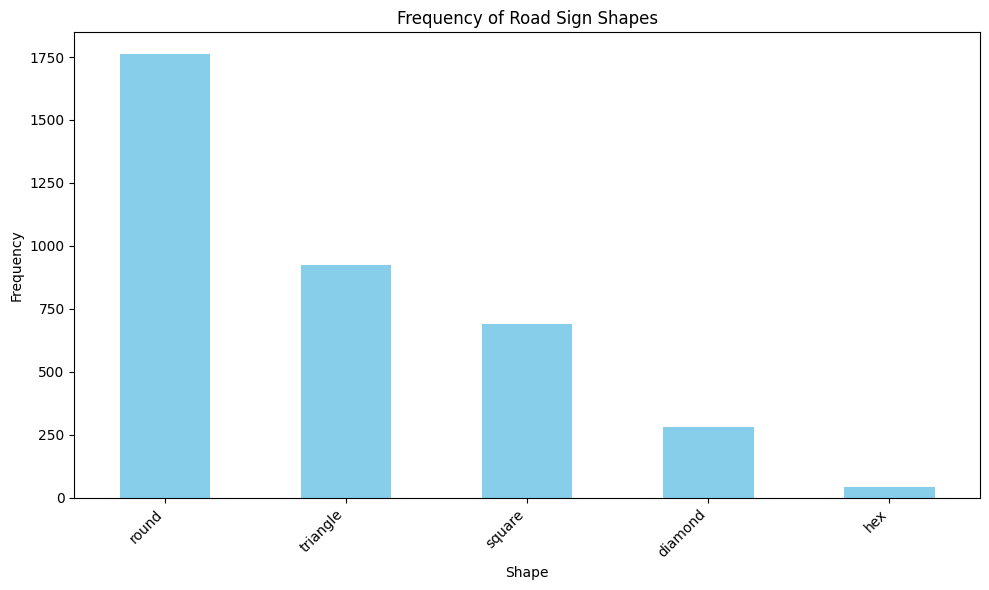

In [12]:
# Plotting length of each label with bar chart
plt.figure(figsize=(10, 6))

# Create a bar plot
shape_counts.plot(kind='bar', color='skyblue')

plt.title('Frequency of Road Sign Shapes')
plt.xlabel('Shape')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


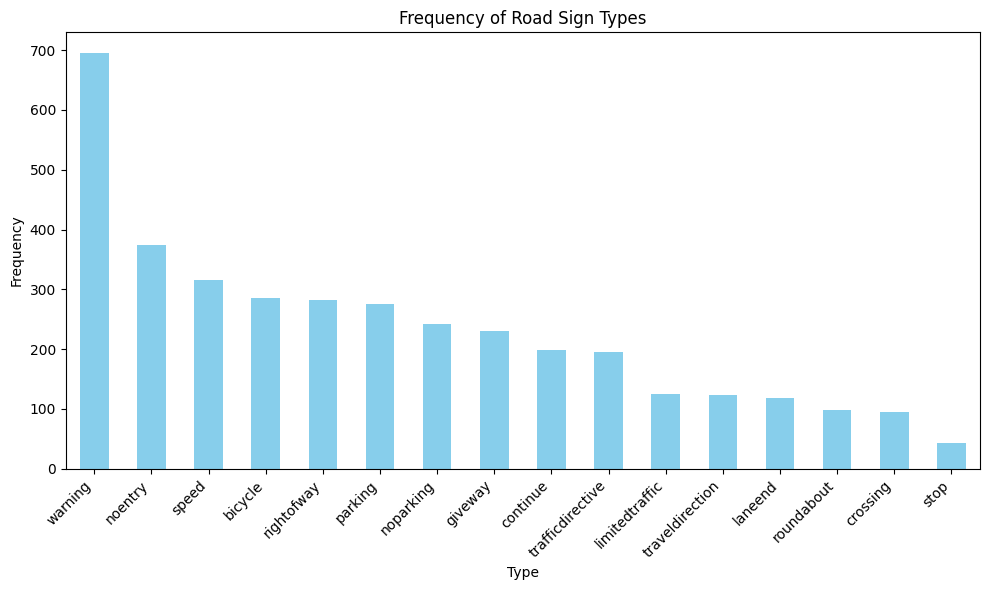

In [13]:
# Plotting length of each label with bar chart
plt.figure(figsize=(10, 6))

# Create a bar plot
type_counts.plot(kind='bar', color='skyblue')

plt.title('Frequency of Road Sign Types')
plt.xlabel('Type')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

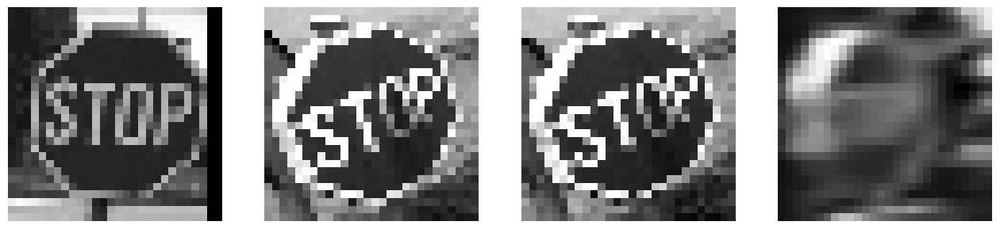

In [29]:
def random_image(pic_list, sample_size=4):
    '''Display a random sample of images from pic_list'''
    fig = plt.gcf()
    fig.set_size_inches(16, 16)  # fig size

    # Randomly select a subset of images from pic_list
    sampled_images = random.sample(pic_list, min(sample_size, len(pic_list)))

    # Load and display the sampled images
    for i, img_path in enumerate(sampled_images):
        img = Image.open(img_path)
        sp = plt.subplot(1, sample_size, i + 1)
        sp.axis('Off')
        plt.imshow(img)

    plt.gray()

# show stop subfolder of hex
random_image(subfolder_variables['hex']['stop'], sample_size=4)


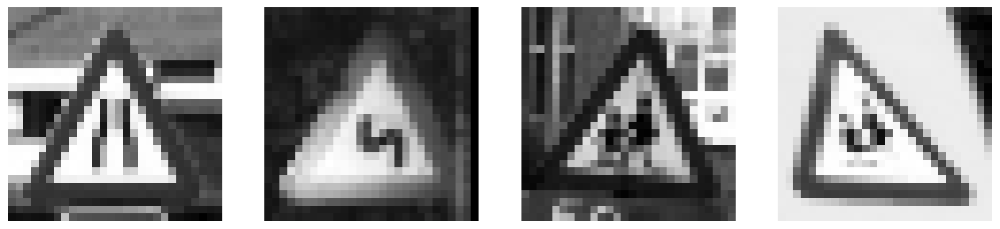

In [15]:
# show warning subfolder of triangle
random_image(subfolder_variables['triangle']['warning'], sample_size=4)

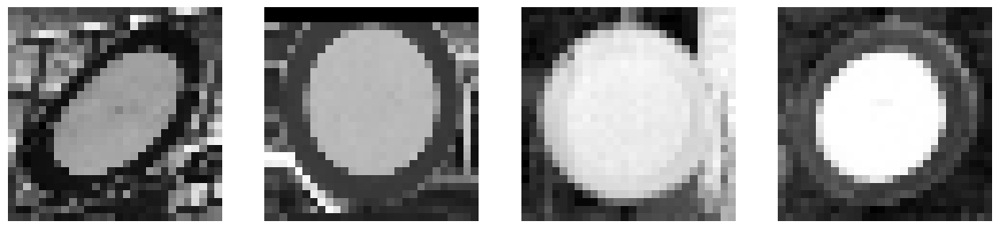

In [16]:
# show limitedtraffic subfolder of round
random_image(subfolder_variables['round']['limitedtraffic'], sample_size=4)

# Data Preprocessing
* Encode shape and type columns

In [30]:
sorted(df_train['shape'].unique())

['diamond', 'hex', 'round', 'square', 'triangle']

In [31]:
encode_shape = {
    'diamond' : 0,
    'hex' : 1,
    'round' : 2,
    'square' : 3,
    'triangle' :4
}

In [32]:
df_train['encoded_shape'] = df_train['shape'].replace(encode_shape)
df_train

,image name,shape,type,encoded_shape,encoded_type
0,trafficsigns_dataset/hex/stop/00684_00001.png,hex,stop,1,12
1,trafficsigns_dataset/hex/stop/00684_00000.png,hex,stop,1,12
2,trafficsigns_dataset/hex/stop/01258_00000.png,hex,stop,1,12
3,trafficsigns_dataset/hex/stop/00375_00000.png,hex,stop,1,12
4,trafficsigns_dataset/hex/stop/01258_00002.png,hex,stop,1,12
...,...,...,...,...,...
3694,trafficsigns_dataset/round/noentry/01636_00000...,round,noentry,2,6
3695,trafficsigns_dataset/round/noentry/00048_00002...,round,noentry,2,6
3696,trafficsigns_dataset/round/noentry/01054_00002...,round,noentry,2,6
3697,trafficsigns_dataset/round/noentry/01289_00000...,round,noentry,2,6


In [33]:
sorted(df_train['type'].unique())

['bicycle',
 'continue',
 'crossing',
 'giveway',
 'laneend',
 'limitedtraffic',
 'noentry',
 'noparking',
 'parking',
 'rightofway',
 'roundabout',
 'speed',
 'stop',
 'trafficdirective',
 'traveldirection',
 'warning']

In [34]:
encode_type = {
    'bicycle' : 0,
    'continue' : 1,
    'crossing' : 2,
    'giveway' : 3,
    'laneend' : 4,
    'limitedtraffic' : 5,
    'noentry' : 6,
    'noparking' : 7,
    'parking' : 8,
    'rightofway' : 9,
    'roundabout' : 10,
    'speed' : 11,
    'stop' : 12,
    'trafficdirective' : 13,
    'traveldirection' : 14,
    'warning' : 15

}

In [35]:
df_train['encoded_type'] = df_train['type'].replace(encode_type)
df_train

,image name,shape,type,encoded_shape,encoded_type
0,trafficsigns_dataset/hex/stop/00684_00001.png,hex,stop,1,12
1,trafficsigns_dataset/hex/stop/00684_00000.png,hex,stop,1,12
2,trafficsigns_dataset/hex/stop/01258_00000.png,hex,stop,1,12
3,trafficsigns_dataset/hex/stop/00375_00000.png,hex,stop,1,12
4,trafficsigns_dataset/hex/stop/01258_00002.png,hex,stop,1,12
...,...,...,...,...,...
3694,trafficsigns_dataset/round/noentry/01636_00000...,round,noentry,2,6
3695,trafficsigns_dataset/round/noentry/00048_00002...,round,noentry,2,6
3696,trafficsigns_dataset/round/noentry/01054_00002...,round,noentry,2,6
3697,trafficsigns_dataset/round/noentry/01289_00000...,round,noentry,2,6


# Edge Detection

In [36]:
dataset_folder = 'trafficsigns_dataset'
subfolders = ['hex', 'triangle', 'diamond', 'square', 'round']

data_edge = []
subfolder_variables_edge = {}

# Iterate over the main subfolders
for label in subfolders:
    subfolder_path = Path(dataset_folder) / label

    # Initialize empty dictionary for sub-subfolders
    subfolder_variables_edge[label] = {}

    # Iterate over sub-subfolders
    for sub_label in subfolder_path.iterdir():
        if sub_label.is_dir():
            images = [file for file in sub_label.iterdir() if file.suffix == '.png']
            subfolder_variables_edge[label][sub_label.name] = images

            # Append image name and label to list
            for image_path in images:
                image = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)

                # Apply blur
                blurred_img = cv2.blur(image, ksize=(2, 2))

                # Calculate median pixel value
                median_pix = np.median(blurred_img)

                # Calculate lower and upper thresholds
                lower = int(max(0, 0.7 * median_pix))
                upper = int(min(255, 1.3 * median_pix))

                # Apply Canny edge detection
                edges = cv2.Canny(image=blurred_img, threshold1=lower, threshold2=upper)

                # Add image path, edges, and label to data list
                data_edge.append({'edges': edges, 'label': f"{label}/{sub_label.name}"})

# Convert data to DataFrame
df_edge = pd.DataFrame(data_edge)
df_edge


,edges,label
0,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",hex/stop
1,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 255, ...",hex/stop
2,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",hex/stop
3,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 255, 0, 255, 0...",hex/stop
4,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",hex/stop
...,...,...
3694,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",round/noentry
3695,"[[0, 0, 0, 0, 0, 255, 0, 0, 0, 0, 0, 0, 0, 0, ...",round/noentry
3696,"[[0, 0, 255, 0, 0, 0, 255, 0, 255, 0, 255, 0, ...",round/noentry
3697,"[[0, 0, 0, 0, 0, 0, 0, 0, 255, 0, 0, 255, 0, 0...",round/noentry


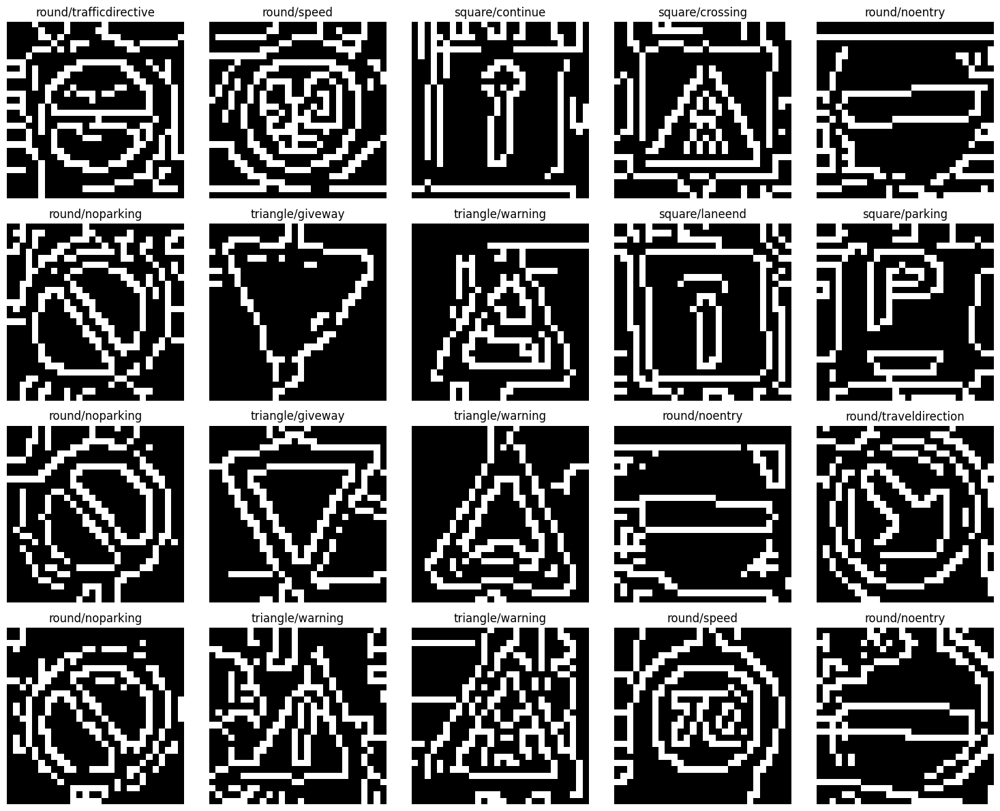

In [37]:
# Randomly select 20 images
random_images = df_edge.sample(20)

# Plot the selected images
fig, axes = plt.subplots(nrows=4, ncols=5, figsize=(15, 12))
for ax, (_, row) in zip(axes.ravel(), random_images.iterrows()):
    ax.imshow(row['edges'], cmap='gray')
    ax.set_title(row['label'])
    ax.axis('off')

plt.tight_layout()
plt.show()


In [38]:
# Define the output folder
output_folder = "processed_images"

# Create the output folder
Path(output_folder).mkdir(parents=True, exist_ok=True)

processed_data = []

# Iterate over the processed data
for index, row in df_edge.iterrows():
    # Construct the file path for saving the image
    output_path = Path(output_folder) / f"{index}.png"

    # Save the processed image
    cv2.imwrite(str(output_path), row['edges'])

    # Update the image path in the DataFrame
    row['image_path'] = str(output_path)
    processed_data.append(row)

print("Processed images saved successfully.")

# Create a DataFrame with updated image paths
df_processed_edge = pd.DataFrame(processed_data)


Processed images saved successfully.


In [39]:
df_processed_edge

,edges,label,image_path
0,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",hex/stop,processed_images/0.png
1,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 255, ...",hex/stop,processed_images/1.png
2,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",hex/stop,processed_images/2.png
3,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 255, 0, 255, 0...",hex/stop,processed_images/3.png
4,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",hex/stop,processed_images/4.png
...,...,...,...
3694,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",round/noentry,processed_images/3694.png
3695,"[[0, 0, 0, 0, 0, 255, 0, 0, 0, 0, 0, 0, 0, 0, ...",round/noentry,processed_images/3695.png
3696,"[[0, 0, 255, 0, 0, 0, 255, 0, 255, 0, 255, 0, ...",round/noentry,processed_images/3696.png
3697,"[[0, 0, 0, 0, 0, 0, 0, 0, 255, 0, 0, 255, 0, 0...",round/noentry,processed_images/3697.png


In [40]:
df_processed_edge.label.unique()

array(['hex/stop', 'triangle/giveway', 'triangle/warning',
       'diamond/rightofway', 'square/parking', 'square/laneend',
       'square/continue', 'square/crossing', 'round/noparking',
       'round/traveldirection', 'round/limitedtraffic', 'round/speed',
       'round/trafficdirective', 'round/roundabout', 'round/bicycle',
       'round/noentry'], dtype=object)

In [41]:
df_processed_edge

,edges,label,image_path
0,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",hex/stop,processed_images/0.png
1,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 255, ...",hex/stop,processed_images/1.png
2,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",hex/stop,processed_images/2.png
3,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 255, 0, 255, 0...",hex/stop,processed_images/3.png
4,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",hex/stop,processed_images/4.png
...,...,...,...
3694,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",round/noentry,processed_images/3694.png
3695,"[[0, 0, 0, 0, 0, 255, 0, 0, 0, 0, 0, 0, 0, 0, ...",round/noentry,processed_images/3695.png
3696,"[[0, 0, 255, 0, 0, 0, 255, 0, 255, 0, 255, 0, ...",round/noentry,processed_images/3696.png
3697,"[[0, 0, 0, 0, 0, 0, 0, 0, 255, 0, 0, 255, 0, 0...",round/noentry,processed_images/3697.png


In [42]:
# Split 'label' column into 'edge_shape' and 'edge_shape_type'
df_processed_edge[['edge_shape', 'edge_shape_type']] = df_processed_edge['label'].str.split('/', expand=True)

# Encode 'edge_shape' and 'edge_shape_type' into numerical representations
edge_shape_dict = {
    'diamond' : 0,
    'hex' : 1,
    'round' : 2,
    'square' : 3,
    'triangle' :4
}
edge_type_dict = {
    'bicycle' : 0,
    'continue' : 1,
    'crossing' : 2,
    'giveway' : 3,
    'laneend' : 4,
    'limitedtraffic' : 5,
    'noentry' : 6,
    'noparking' : 7,
    'parking' : 8,
    'rightofway' : 9,
    'roundabout' : 10,
    'speed' : 11,
    'stop' : 12,
    'trafficdirective' : 13,
    'traveldirection' : 14,
    'warning' : 15

}

df_processed_edge['encoded_edge_shape'] = df_processed_edge['edge_shape'].map(edge_shape_dict)
df_processed_edge['encoded_edge_type'] = df_processed_edge['edge_shape_type'].map(edge_type_dict)

# Drop the original 'label' column
df_processed_edge.drop(columns=['label'], inplace=True)

In [43]:
df_processed_edge

,edges,image_path,edge_shape,edge_shape_type,encoded_edge_shape,encoded_edge_type
0,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",processed_images/0.png,hex,stop,1,12
1,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 255, ...",processed_images/1.png,hex,stop,1,12
2,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",processed_images/2.png,hex,stop,1,12
3,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 255, 0, 255, 0...",processed_images/3.png,hex,stop,1,12
4,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",processed_images/4.png,hex,stop,1,12
...,...,...,...,...,...,...
3694,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",processed_images/3694.png,round,noentry,2,6
3695,"[[0, 0, 0, 0, 0, 255, 0, 0, 0, 0, 0, 0, 0, 0, ...",processed_images/3695.png,round,noentry,2,6
3696,"[[0, 0, 255, 0, 0, 0, 255, 0, 255, 0, 255, 0, ...",processed_images/3696.png,round,noentry,2,6
3697,"[[0, 0, 0, 0, 0, 0, 0, 0, 255, 0, 0, 255, 0, 0...",processed_images/3697.png,round,noentry,2,6


# Smote

In [79]:
image_paths = df_train['image name'].tolist()
labels = df_train['type'].tolist()

# Identify class imbalance
class_counts = pd.Series(labels).value_counts()
max_class_count = class_counts.max()
imbalanced_classes = class_counts[class_counts < max_class_count].index.tolist()

# Iterate over each imbalanced class
for class_label in imbalanced_classes:
    num_synthetic_images = max_class_count - class_counts[class_label]
    print(class_label, num_synthetic_images)

noentry 320
speed 379
bicycle 410
rightofway 413
parking 419
noparking 453
giveway 464
continue 496
trafficdirective 500
limitedtraffic 570
traveldirection 571
laneend 577
roundabout 597
crossing 600
stop 652


In [80]:
def load_image(image_path):
    """Load an image and convert it to a NumPy array."""
    with Image.open(image_path) as img:
        return np.array(img)

In [81]:
df_synthetic = pd.DataFrame(columns=['image name', 'shape', 'type', 'encoded_shape', 'encoded_type'])

# Get the maximum class count
max_class_count = df_train['type'].value_counts().max()

# Get the imbalanced classes
imbalanced_classes = df_train['type'].value_counts()[df_train['type'].value_counts() < max_class_count].index.tolist()

# Create an instance of SMOTE with the 'not majority' sampling strategy
smote = SMOTE(sampling_strategy='not majority', random_state=42)

images = []
labels = []

for class_label in imbalanced_classes:
    # Filter images belonging to the current class
    class_images = df_train[df_train['type'] == class_label]['image name'].tolist()

    # Reshape images and flatten
    images.extend([load_image(image_path).flatten() for image_path in class_images])

    # Create corresponding labels for the images
    labels.extend([class_label for _ in range(len(class_images))])

In [82]:
images = np.array(images)
labels = np.array(labels)

rus = RandomUnderSampler(sampling_strategy='majority', random_state=42)

# Undersample the majority class
undersampled_images, undersampled_labels = rus.fit_resample(images, labels)

# Create synthetic samples
synthetic_samples, synthetic_labels = smote.fit_resample(undersampled_images, undersampled_labels)

In [83]:
image_size = (28, 28)

output_dir = "synthetic_images"

# Create the directory
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

for i, (synthetic_sample, synthetic_label) in enumerate(zip(synthetic_samples, synthetic_labels)):
    # Reshape sample to original dimension
    synthetic_image_array = synthetic_sample.reshape(image_size)

    # Convert the array to an image object
    synthetic_image = Image.fromarray(synthetic_image_array.astype('uint8'))

    # Define the output path for the image
    output_path = os.path.join(output_dir, f"synthetic_image_{i}.png")
    synthetic_image.save(output_path)

    # Add the image path and corresponding labels
    df_synthetic.loc[i] = [output_path, df_train[df_train['type'] == synthetic_label]['shape'].iloc[0], synthetic_label, df_train[df_train['type'] == synthetic_label]['encoded_shape'].iloc[0], df_train[df_train['type'] == synthetic_label]['encoded_type'].iloc[0]]

# concact to new dataframe
df_smote= pd.concat([df_train, df_synthetic])

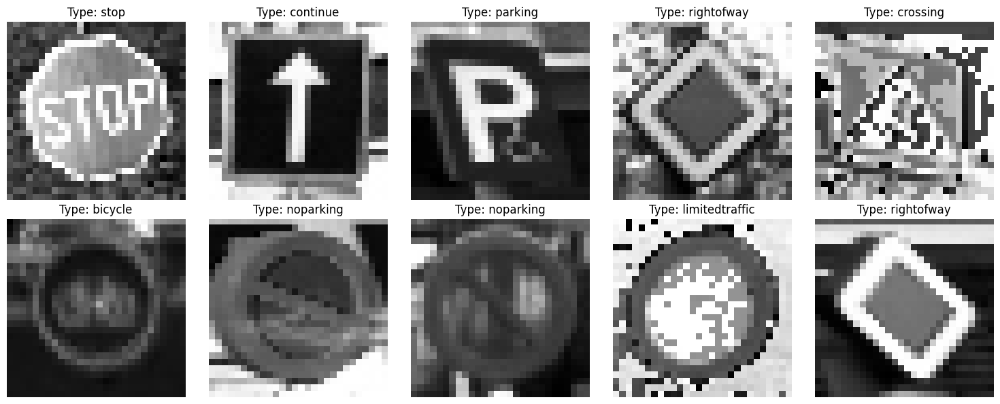

In [85]:
# Function to plot a grid of images with labels
def plot_images(df, num_images=10):
    # Select a subset of the dataframe
    df_subset = df.sample(n=num_images, random_state=42)

    # Define the number of rows and columns for the plot
    num_rows = int(np.ceil(num_images / 5))
    num_cols = min(num_images, 5)

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 3))

    # Flatten axes array for easy iteration
    axes = axes.flatten()

    for ax, (_, row) in zip(axes, df_subset.iterrows()):
        img_path = row['image name']
        label = row['type']
        image = Image.open(img_path)

        ax.imshow(image, cmap='gray')
        ax.set_title(f'Type: {label}')
        ax.axis('off')

    # Hide any remaining empty subplots
    for ax in axes[len(df_subset):]:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

plot_images(df_synthetic, num_images=10)

In [84]:
df_smote

,image name,shape,type,encoded_shape,encoded_type
0,trafficsigns_dataset/hex/stop/00684_00001.png,hex,stop,1,12
1,trafficsigns_dataset/hex/stop/00684_00000.png,hex,stop,1,12
2,trafficsigns_dataset/hex/stop/01258_00000.png,hex,stop,1,12
3,trafficsigns_dataset/hex/stop/00375_00000.png,hex,stop,1,12
4,trafficsigns_dataset/hex/stop/01258_00002.png,hex,stop,1,12
...,...,...,...,...,...
4735,synthetic_images/synthetic_image_4735.png,round,traveldirection,2,14
4736,synthetic_images/synthetic_image_4736.png,round,traveldirection,2,14
4737,synthetic_images/synthetic_image_4737.png,round,traveldirection,2,14
4738,synthetic_images/synthetic_image_4738.png,round,traveldirection,2,14


In [50]:
smote_type_counts = df_smote['type'].value_counts()
print(smote_type_counts)
smote_shape_counts = df_smote['shape'].value_counts()
print(smote_shape_counts)

type
warning             695
noentry             691
speed               632
bicycle             601
rightofway          598
parking             592
noparking           558
giveway             547
continue            515
trafficdirective    511
limitedtraffic      441
traveldirection     440
laneend             434
roundabout          414
crossing            411
stop                359
Name: count, dtype: int64
shape
round       4288
square      1952
triangle    1242
diamond      598
hex          359
Name: count, dtype: int64


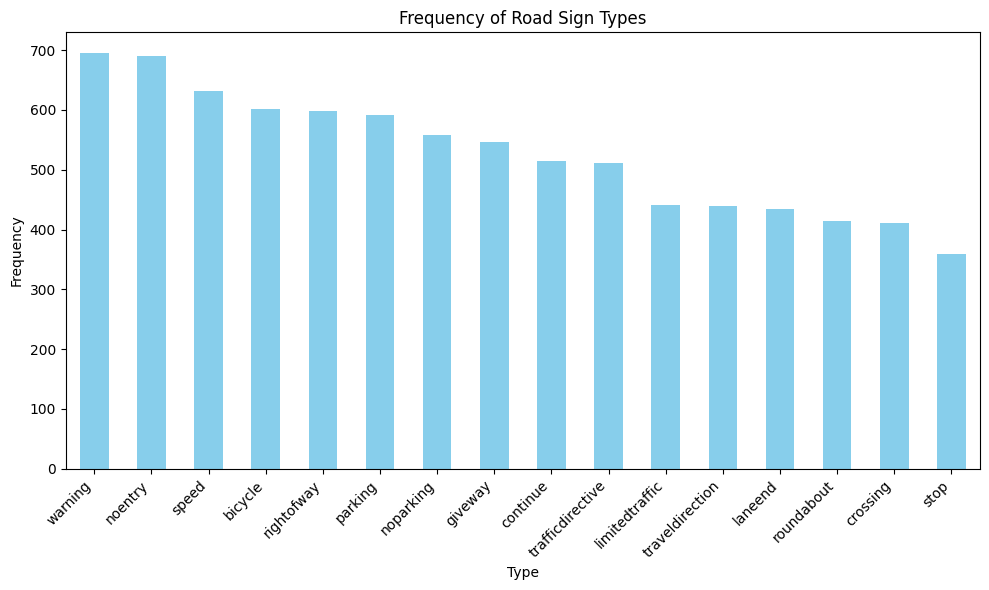

In [51]:
# Plotting length of each label with bar chart
plt.figure(figsize=(10, 6))

# Create a bar plot
smote_type_counts.plot(kind='bar', color='skyblue')

plt.title('Frequency of Road Sign Types')
plt.xlabel('Type')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

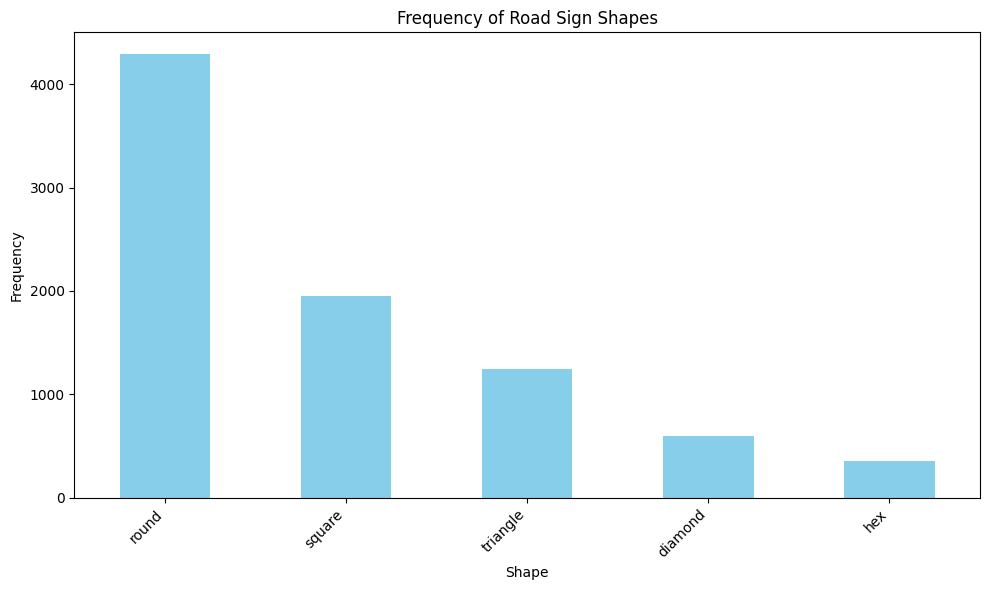

In [78]:
# Plotting length of each label with bar chart
plt.figure(figsize=(10, 6))

# Create a bar plot
smote_shape_counts.plot(kind='bar', color='skyblue')

plt.title('Frequency of Road Sign Shapes')
plt.xlabel('Shape')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [54]:
train_data_smote, val_data_smote = train_test_split(df_smote, test_size=0.2, random_state=45)
print("Train data : {}, Val Data: {}".format(train_data_smote.shape[0], val_data_smote.shape[0]))

Train data : 6751, Val Data: 1688


# Loading Test Dataset
* Find Classes
* Create test dataframe from European Traffic Sign Dataset
* Add pictures of melbourne signs
* EDA of Test dataset
* Data Preprocessing of Test Dataset

### Finding Classes

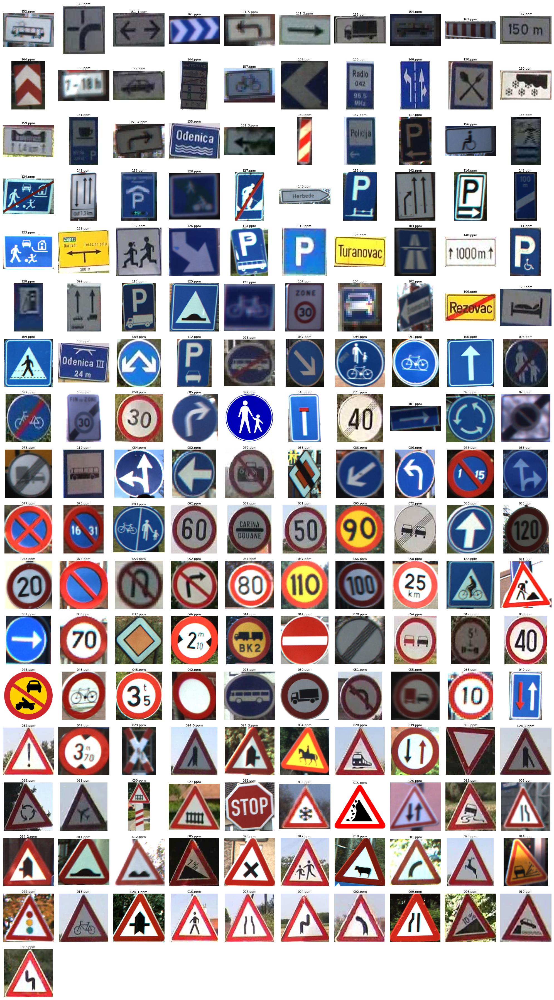

In [86]:
folder_path = '/content/drive/My Drive/COSC2673A2/Classes'

# List all files in the folder
files = os.listdir(folder_path)

# Filter out PPM files
ppm_files = [f for f in files if f.endswith('.ppm')]

# Calculate the number of rows needed
num_rows = (len(ppm_files) // 10) + 1

# Create a grid of subplots
fig, axs = plt.subplots(num_rows, 10, figsize=(20, num_rows * 2))

# Loop through each PPM file and process it
for i, ppm_file in enumerate(ppm_files):
    row = i // 10
    col = i % 10
    file_path = os.path.join(folder_path, ppm_file)

    # Open the PPM file using PIL
    with Image.open(file_path) as img:
        # Display the image inline
        axs[row, col].imshow(img)
        axs[row, col].axis('off')  # Turn off axis

        # Add the file name as a title underneath the image
        axs[row, col].set_title(ppm_file, fontsize=8, pad=2)

# Hide any empty subplots
for i in range(len(ppm_files), num_rows * 10):
    row = i // 10
    col = i % 10
    axs[row, col].axis('off')

plt.tight_layout()
plt.show()


Looking at the pictures we see the which classes we need:

Triangle:
* Giveway - Class 35
* Warning - Class 23, 11, 12, 32, 24.2, 24.3, 24.1

Diamond:
* RightOfWay - Class 37

Round:
* speed - Classes 66, 68, 64, 61, 60, 62, 63, 59, 56, and 57
* traveldirection - Class 80, 81, 82, and 83
* bicycle - Class 91
* noparking - Class 74
* roundabout - Class 90
* trafficdirective - Class 50, 51, 54, and 55
* limitedtraffic - Class 42
* noentry - Class 41

Hex:
* Stop - Class 36

Square:
* Laneend - Class 143
* Continue Class 100
* Parking - Class 110, 111, 112, 114, 115
* Crossing - Class 109



Next 20% all the same size off the validation dataset will be taken.

### Adding to our test set using the European Traffic Sign Dataset

In [87]:
dataset_folder = 'Testing'

# List subfolders in dataset folder
subfolders = [subfolder for subfolder in os.listdir(dataset_folder) if os.path.isdir(os.path.join(dataset_folder, subfolder))]

# Iterate over subfolders
for subfolder in subfolders:
    subfolder_path = os.path.join(dataset_folder, subfolder)
    print(f"Subfolder: {subfolder}")

Subfolder: 041
Subfolder: 050
Subfolder: 051
Subfolder: 082
Subfolder: 020
Subfolder: 064
Subfolder: 080
Subfolder: 023
Subfolder: 105
Subfolder: 013
Subfolder: 044
Subfolder: 048
Subfolder: 036
Subfolder: 106
Subfolder: 058
Subfolder: 010
Subfolder: 019
Subfolder: 063
Subfolder: round
Subfolder: square
Subfolder: 039
Subfolder: 112
Subfolder: 038
Subfolder: 037
Subfolder: 045
Subfolder: 024
Subfolder: 143
Subfolder: 021
Subfolder: 090
Subfolder: 016
Subfolder: 067
Subfolder: 012
Subfolder: 017
Subfolder: 018
Subfolder: 074
Subfolder: 115
Subfolder: 052
Subfolder: 110
Subfolder: 095
Subfolder: 042
Subfolder: 068
Subfolder: 054
Subfolder: 066
Subfolder: 065
Subfolder: 053
Subfolder: diamond
Subfolder: 035
Subfolder: 060
Subfolder: 103
Subfolder: 055
Subfolder: 043
Subfolder: 022
Subfolder: 109
Subfolder: 099
Subfolder: 046
Subfolder: 111
Subfolder: 015
Subfolder: 059
Subfolder: 101
Subfolder: 081
Subfolder: triangle
Subfolder: 062
Subfolder: 113
Subfolder: 047
Subfolder: 061
Subfolder: 

In [88]:
# Function to convert images to grayscale and resize them
def preprocess_image(image_path):
    # Open the image
    img = Image.open(image_path)

    # Convert to grayscale
    img_gray = img.convert('L')

    # Resize to 28x28
    img_resized = img_gray.resize((28, 28))

    return img_resized

In [89]:
# Define dataset folder
dataset_folder = 'Testing'

# Define classes and their corresponding Classes
classes = {
    "triangle/giveway": ['035'],
    "triangle/warning": ['023', '011', '012', '032', '024'],
    "diamond/rightofway": ['037'],
    "round/speed": ['066', '068', '064', '061', '060', '062', '063', '059', '056', '057'],
    "round/traveldirection": ['080', '081', '082', '083'],
    "round/bicycle": ['091'],
    "round/noparking": ['074'],
    "round/roundabout": ['090'],
    "round/trafficdirective": ['050', '054', '055'],
    "round/limitedtraffic": ['042'],
    "round/noentry": ['041'],
    "hex/stop": ['036'],
    "square/laneend": ['143'],
    "square/continue": ['100'],
    "square/parking": ['110', '111', '112', '114', '115'],
    "square/crossing": ['109']
}


In [90]:
# Create a dictionary to store counts of images for each class
class_counts = {class_name: 0 for class_name in classes.keys()}
data = []

# Iterate over subfolders
for subfolder in os.listdir(dataset_folder):
    subfolder_path = os.path.join(dataset_folder, subfolder)

    # Extract the last two characters of the subfolder name
    match = re.search(r'\d{2}(\d+)$', subfolder)
    if match:
        subfolder_id = match.group()

        # Check if the extracted subfolder ID matches any class IDs
        for class_name, class_ids in classes.items():
            if subfolder_id in class_ids and class_counts[class_name] < 100:
                print(f"Processing images in subfolder {subfolder} for class {class_name}")

                # Get a list of all image files in the subfolder
                image_files = [f for f in os.listdir(subfolder_path) if f.endswith('.ppm')]

                # Select 50 images
                num_needed = 50 - class_counts[class_name]
                selected_images = random.sample(image_files, min(num_needed, len(image_files)))

                for image_file in selected_images:
                    image_path = os.path.join(subfolder_path, image_file)

                    # Preprocess the image
                    img_resized = preprocess_image(image_path)

                    output_folder = os.path.join(dataset_folder, class_name)
                    os.makedirs(output_folder, exist_ok=True)
                    output_file = f"{image_file[:-4]}.png"
                    output_path = os.path.join(output_folder, output_file)

                    # Save the preprocessed image
                    img_resized.save(output_path)

                    # Append image path and label to data list and increment
                    data.append({'image name': output_path, 'label': class_name})
                    class_counts[class_name] += 1

# Create a DataFrame from the data
df_test = pd.DataFrame(data)


Processing images in subfolder 041 for class round/noentry
Processing images in subfolder 050 for class round/trafficdirective
Processing images in subfolder 082 for class round/traveldirection
Processing images in subfolder 064 for class round/speed
Processing images in subfolder 080 for class round/traveldirection
Processing images in subfolder 023 for class triangle/warning
Processing images in subfolder 036 for class hex/stop
Processing images in subfolder 063 for class round/speed
Processing images in subfolder 112 for class square/parking
Processing images in subfolder 037 for class diamond/rightofway
Processing images in subfolder 024 for class triangle/warning
Processing images in subfolder 143 for class square/laneend
Processing images in subfolder 090 for class round/roundabout
Processing images in subfolder 012 for class triangle/warning
Processing images in subfolder 074 for class round/noparking
Processing images in subfolder 115 for class square/parking
Processing images 

In [91]:
# check class coverage
for class_name in classes.keys():
    if class_counts[class_name] == 0:
        print(f"Class '{class_name}' was not found in the dataset.")

# print class information
for class_name, count in class_counts.items():
    print(f"Class '{class_name}': {count} images processed")

# check if any class has fewer than 100 images
for class_name, count in class_counts.items():
    if count < 50:
        print(f"Class '{class_name}' has fewer than 50 images.")

Class 'triangle/giveway': 50 images processed
Class 'triangle/warning': 50 images processed
Class 'diamond/rightofway': 50 images processed
Class 'round/speed': 50 images processed
Class 'round/traveldirection': 50 images processed
Class 'round/bicycle': 50 images processed
Class 'round/noparking': 50 images processed
Class 'round/roundabout': 50 images processed
Class 'round/trafficdirective': 50 images processed
Class 'round/limitedtraffic': 50 images processed
Class 'round/noentry': 50 images processed
Class 'hex/stop': 50 images processed
Class 'square/laneend': 50 images processed
Class 'square/continue': 35 images processed
Class 'square/parking': 50 images processed
Class 'square/crossing': 50 images processed
Class 'square/continue' has fewer than 50 images.


In [92]:
df_test

,image name,label
0,Testing/round/noentry/G_05304.png,round/noentry
1,Testing/round/noentry/B_00007_00001.png,round/noentry
2,Testing/round/noentry/G_04804.png,round/noentry
3,Testing/round/noentry/G_02547.png,round/noentry
4,Testing/round/noentry/G_06870.png,round/noentry
...,...,...
780,Testing/square/continue/B_02576_00001.png,square/continue
781,Testing/square/continue/B_02134_00002.png,square/continue
782,Testing/square/continue/B_00147_00000.png,square/continue
783,Testing/square/continue/B_02394_00000.png,square/continue


In [93]:
print(df_test['label'].unique())

['round/noentry' 'round/trafficdirective' 'round/traveldirection'
 'round/speed' 'triangle/warning' 'hex/stop' 'square/parking'
 'diamond/rightofway' 'square/laneend' 'round/roundabout'
 'round/noparking' 'round/limitedtraffic' 'triangle/giveway'
 'square/crossing' 'round/bicycle' 'square/continue']


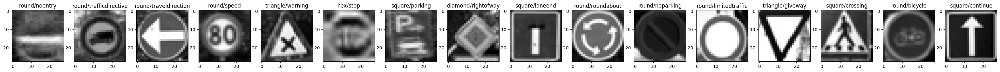

In [94]:
# Get a unique class from the DataFrame
unique_classes = df_test['label'].unique()

fig, axs = plt.subplots(1, len(unique_classes), figsize=(40, 30))

for i, class_name in enumerate(unique_classes):
    # Get the first image of this class
    sample_image_path = df_test[df_test['label'] == class_name]['image name'].iloc[0]

    # Open the image file
    img = Image.open(sample_image_path)

    # Plot the image
    axs[i].imshow(img)
    axs[i].set_title(class_name)

plt.gray()


In [95]:
def get_image_hash(image_path):
    """Compute a hash value for an image."""
    with open(image_path, 'rb') as f:
        return hashlib.md5(f.read()).hexdigest()

# Compute hash values for images in the training set
df['hash'] = df['image name'].apply(get_image_hash)

# Compute hash values for images in the test set
df_test['hash'] = df_test['image name'].apply(get_image_hash)

# Find duplicates
duplicates = df_test[df_test['hash'].isin(df['hash'])].index
print(duplicates)

# Drop duplicates from the test set
df_test = df_test.drop(duplicates)


Index([], dtype='int64')


### Adding images taken from around melbourne

In [96]:
folder_path = '/content/drive/My Drive/COSC2673A2/images'
data = []

# Define patterns and corresponding labels
patterns_labels = {
    re.compile(r'^Stop.*'): 'hex/stop',
    re.compile(r'^Speed.*'): 'round/speed',
    re.compile(r'^Parking.*'): 'square/parking',
    re.compile(r'^NoEntry.*'): 'round/noentry',
    re.compile(r'^travel.*'): 'round/trafficdirective'
}

files = os.listdir(folder_path)
# Match filenames with patterns and assign labels
for file_name in files:
    # Iterate over patterns and labels to match filename
    for pattern, label in patterns_labels.items():
        if pattern.match(file_name):
            file_path = os.path.join(folder_path, file_name)
            data.append({'image name': file_path, 'label': label})

# Create DataFrame from the data
df_images = pd.DataFrame(data)
df_images

,image name,label
0,/content/drive/My Drive/COSC2673A2/images/trav...,round/trafficdirective
1,/content/drive/My Drive/COSC2673A2/images/Stop...,hex/stop
2,/content/drive/My Drive/COSC2673A2/images/Park...,square/parking
3,/content/drive/My Drive/COSC2673A2/images/NoEn...,round/noentry
4,/content/drive/My Drive/COSC2673A2/images/NoEn...,round/noentry
5,/content/drive/My Drive/COSC2673A2/images/Stop...,hex/stop
6,/content/drive/My Drive/COSC2673A2/images/Stop...,hex/stop
7,/content/drive/My Drive/COSC2673A2/images/Stop...,hex/stop
8,/content/drive/My Drive/COSC2673A2/images/Park...,square/parking
9,/content/drive/My Drive/COSC2673A2/images/Spee...,round/speed


In [97]:

# Define the folder containing the images
folder_path = '/content/drive/My Drive/COSC2673A2/images'

# Define patterns and corresponding labels
patterns_labels = {
    re.compile(r'^Stop.*'): 'hex/stop',
    re.compile(r'^Speed.*'): 'round/speed',
    re.compile(r'^Parking.*'): 'square/parking',
    re.compile(r'^NoEntry.*'): 'round/noentry',
    re.compile(r'^travel.*'): 'round/trafficdirective'
}

# Iterate over the files in the folder
for filename in os.listdir(folder_path):
    # Iterate over the patterns and labels
    for pattern, label in patterns_labels.items():
        # Check if the filename matches the pattern
        if pattern.match(filename):
            # Construct the full file path
            filepath = os.path.join(folder_path, filename)
            # Open the image
            with Image.open(filepath) as img:
                # Resize the image to 28x28
                img_resized = ImageOps.fit(img, (28, 28), method=0, bleed=0.0, centering=(0.5, 0.5))
                # Convert the image to grayscale
                img_grayscale = img_resized.convert('L')
                # Save the grayscale image back to the original file path
                display(img_grayscale)
                img_grayscale.save(filepath)


# Create DataFrame from the data
df_images = pd.DataFrame(data)
df_images


,image name,label
0,/content/drive/My Drive/COSC2673A2/images/trav...,round/trafficdirective
1,/content/drive/My Drive/COSC2673A2/images/Stop...,hex/stop
2,/content/drive/My Drive/COSC2673A2/images/Park...,square/parking
3,/content/drive/My Drive/COSC2673A2/images/NoEn...,round/noentry
4,/content/drive/My Drive/COSC2673A2/images/NoEn...,round/noentry
5,/content/drive/My Drive/COSC2673A2/images/Stop...,hex/stop
6,/content/drive/My Drive/COSC2673A2/images/Stop...,hex/stop
7,/content/drive/My Drive/COSC2673A2/images/Stop...,hex/stop
8,/content/drive/My Drive/COSC2673A2/images/Park...,square/parking
9,/content/drive/My Drive/COSC2673A2/images/Spee...,round/speed


In [98]:
df_test = pd.concat([df_test, df_images], ignore_index=True) # concat with test dataframe
df_test

,image name,label,hash
0,Testing/round/noentry/G_05304.png,round/noentry,6b4ca8e0c44516ed6351b28a35627b9e
1,Testing/round/noentry/B_00007_00001.png,round/noentry,6bd6e555c66c833f5ba627f8b4849406
2,Testing/round/noentry/G_04804.png,round/noentry,1a9409961836ef6ac904d0b5f395d8f8
3,Testing/round/noentry/G_02547.png,round/noentry,7a61e1455e42cf8b7615484b75bf5d65
4,Testing/round/noentry/G_06870.png,round/noentry,5b8e40d02c3b94b77cb2f76a38acd074
...,...,...,...
791,/content/drive/My Drive/COSC2673A2/images/Stop...,hex/stop,NaN
792,/content/drive/My Drive/COSC2673A2/images/Stop...,hex/stop,NaN
793,/content/drive/My Drive/COSC2673A2/images/Park...,square/parking,NaN
794,/content/drive/My Drive/COSC2673A2/images/Spee...,round/speed,NaN


### Data Preprocessing Steps and EDA

In [99]:
df_test[['shape','type']] = df_test['label'].str.split("/",expand=True)
df_test = df_test.drop('label',axis=1)
df_test

,image name,hash,shape,type
0,Testing/round/noentry/G_05304.png,6b4ca8e0c44516ed6351b28a35627b9e,round,noentry
1,Testing/round/noentry/B_00007_00001.png,6bd6e555c66c833f5ba627f8b4849406,round,noentry
2,Testing/round/noentry/G_04804.png,1a9409961836ef6ac904d0b5f395d8f8,round,noentry
3,Testing/round/noentry/G_02547.png,7a61e1455e42cf8b7615484b75bf5d65,round,noentry
4,Testing/round/noentry/G_06870.png,5b8e40d02c3b94b77cb2f76a38acd074,round,noentry
...,...,...,...,...
791,/content/drive/My Drive/COSC2673A2/images/Stop...,NaN,hex,stop
792,/content/drive/My Drive/COSC2673A2/images/Stop...,NaN,hex,stop
793,/content/drive/My Drive/COSC2673A2/images/Park...,NaN,square,parking
794,/content/drive/My Drive/COSC2673A2/images/Spee...,NaN,round,speed


In [100]:
# find shape and type length
shape_counts_test = df_test['shape'].value_counts()
type_counts_test = df_test['type'].value_counts()
print(shape_counts_test)
print(type_counts_test)

shape
round       404
square      187
triangle    100
hex          55
diamond      50
Name: count, dtype: int64
type
stop                55
noentry             52
parking             52
trafficdirective    51
speed               51
traveldirection     50
warning             50
rightofway          50
laneend             50
roundabout          50
noparking           50
limitedtraffic      50
giveway             50
crossing            50
bicycle             50
continue            35
Name: count, dtype: int64


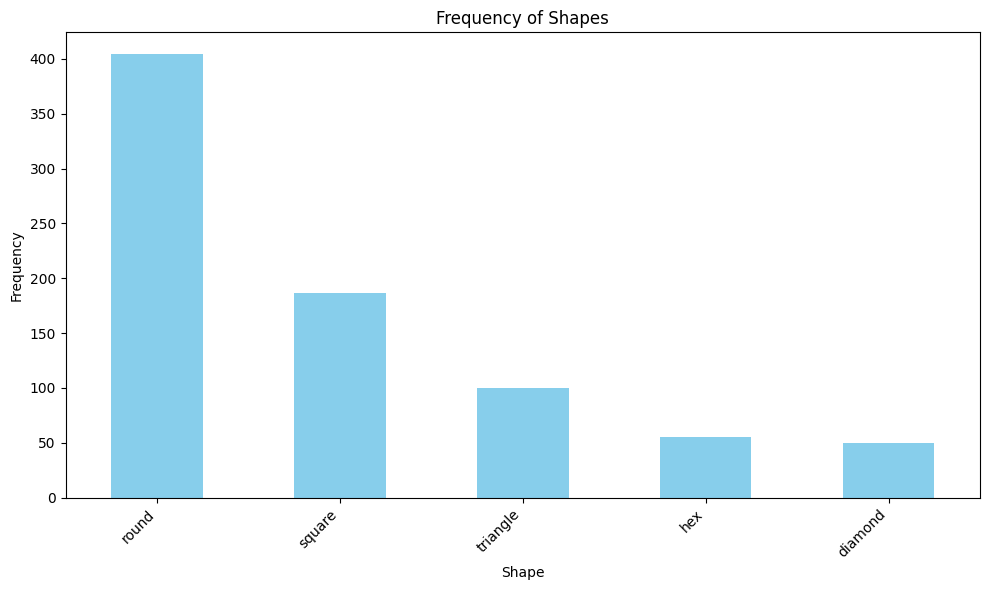

In [101]:
# Plotting length of each label with bar chart
plt.figure(figsize=(10, 6))

# Create a bar plot
shape_counts_test.plot(kind='bar', color='skyblue')

plt.title('Frequency of Shapes')
plt.xlabel('Shape')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


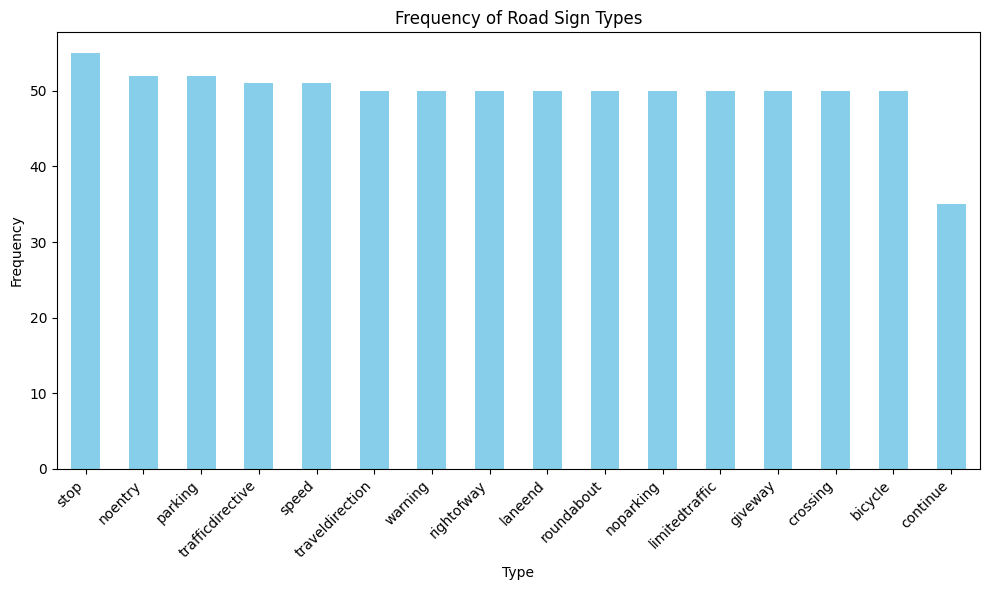

In [102]:
# Plotting length of each label with bar chart
plt.figure(figsize=(10, 6))

# Create a bar plot
type_counts_test.plot(kind='bar', color='skyblue')

plt.title('Frequency of Road Sign Types')
plt.xlabel('Type')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [103]:
sorted(df_test['shape'].unique())

['diamond', 'hex', 'round', 'square', 'triangle']

In [104]:
encode_shape = {
    'diamond' : 0,
    'hex' : 1,
    'round' : 2,
    'square' : 3,
    'triangle' :4
}

In [105]:
df_test['encoded_shape'] = df_test['shape'].replace(encode_shape)
df_test

,image name,hash,shape,type,encoded_shape
0,Testing/round/noentry/G_05304.png,6b4ca8e0c44516ed6351b28a35627b9e,round,noentry,2
1,Testing/round/noentry/B_00007_00001.png,6bd6e555c66c833f5ba627f8b4849406,round,noentry,2
2,Testing/round/noentry/G_04804.png,1a9409961836ef6ac904d0b5f395d8f8,round,noentry,2
3,Testing/round/noentry/G_02547.png,7a61e1455e42cf8b7615484b75bf5d65,round,noentry,2
4,Testing/round/noentry/G_06870.png,5b8e40d02c3b94b77cb2f76a38acd074,round,noentry,2
...,...,...,...,...,...
791,/content/drive/My Drive/COSC2673A2/images/Stop...,NaN,hex,stop,1
792,/content/drive/My Drive/COSC2673A2/images/Stop...,NaN,hex,stop,1
793,/content/drive/My Drive/COSC2673A2/images/Park...,NaN,square,parking,3
794,/content/drive/My Drive/COSC2673A2/images/Spee...,NaN,round,speed,2


In [106]:
sorted(df_test['type'].unique())

['bicycle',
 'continue',
 'crossing',
 'giveway',
 'laneend',
 'limitedtraffic',
 'noentry',
 'noparking',
 'parking',
 'rightofway',
 'roundabout',
 'speed',
 'stop',
 'trafficdirective',
 'traveldirection',
 'warning']

In [107]:
encode_type = {
    'bicycle' : 0,
    'continue' : 1,
    'crossing' : 2,
    'giveway' : 3,
    'laneend' : 4,
    'limitedtraffic' : 5,
    'noentry' : 6,
    'noparking' : 7,
    'parking' : 8,
    'rightofway' : 9,
    'roundabout' : 10,
    'speed' : 11,
    'stop' : 12,
    'trafficdirective' : 13,
    'traveldirection' : 14,
    'warning' : 15

}

In [108]:
df_test['encoded_type'] = df_test['type'].replace(encode_type)
df_test

,image name,hash,shape,type,encoded_shape,encoded_type
0,Testing/round/noentry/G_05304.png,6b4ca8e0c44516ed6351b28a35627b9e,round,noentry,2,6
1,Testing/round/noentry/B_00007_00001.png,6bd6e555c66c833f5ba627f8b4849406,round,noentry,2,6
2,Testing/round/noentry/G_04804.png,1a9409961836ef6ac904d0b5f395d8f8,round,noentry,2,6
3,Testing/round/noentry/G_02547.png,7a61e1455e42cf8b7615484b75bf5d65,round,noentry,2,6
4,Testing/round/noentry/G_06870.png,5b8e40d02c3b94b77cb2f76a38acd074,round,noentry,2,6
...,...,...,...,...,...,...
791,/content/drive/My Drive/COSC2673A2/images/Stop...,NaN,hex,stop,1,12
792,/content/drive/My Drive/COSC2673A2/images/Stop...,NaN,hex,stop,1,12
793,/content/drive/My Drive/COSC2673A2/images/Park...,NaN,square,parking,3,8
794,/content/drive/My Drive/COSC2673A2/images/Spee...,NaN,round,speed,2,11


# Splitting into train and test sets

In [114]:
train_data, val_data = train_test_split(df_train, test_size=0.2, random_state=45)
print("Train data : {}, Val Data: {}".format(train_data.shape[0], val_data.shape[0]))

Train data : 2959, Val Data: 740


In [115]:
val_data['encoded_shape'].head()

653     4
1427    3
2162    2
575     4
1180    0
Name: encoded_shape, dtype: int64

In [116]:
y_val_shape = val_data['encoded_shape'].astype(int).values
print(y_val_shape)
y_val_type = val_data['encoded_type'].astype(int).values

[4 3 2 4 0 2 2 4 2 4 4 2 3 3 0 3 4 3 1 2 3 0 4 2 2 2 0 3 4 0 2 3 0 2 2 3 2
 2 2 2 3 4 2 2 2 2 2 2 4 4 2 2 2 3 4 4 4 2 3 2 4 2 2 3 2 4 3 2 2 4 2 2 3 4
 4 4 2 4 2 2 2 3 3 3 2 4 4 2 4 0 2 2 0 2 3 2 0 2 4 3 4 3 4 3 3 4 2 4 2 4 0
 2 3 3 2 2 3 2 4 3 2 2 2 3 2 0 2 3 0 3 2 2 2 1 2 3 2 2 4 0 2 2 2 2 4 4 2 3
 3 2 2 0 2 4 3 2 3 2 2 2 2 0 3 3 4 2 2 4 4 3 2 3 3 4 2 2 4 2 2 1 3 2 2 2 4
 4 4 2 2 3 2 2 2 4 2 4 0 4 4 2 3 2 2 0 3 4 3 0 2 2 2 0 3 4 2 4 4 4 4 2 2 2
 2 3 0 4 4 4 2 2 1 2 1 0 2 4 4 4 4 4 2 2 2 4 2 1 2 4 4 2 0 4 3 2 2 4 2 4 2
 2 3 2 2 2 4 2 4 2 3 2 2 4 2 2 2 3 4 4 2 2 4 3 2 4 0 2 2 4 2 0 0 2 0 3 4 3
 1 4 2 4 4 4 2 1 2 2 4 2 4 3 1 4 2 3 0 4 4 2 4 3 4 4 2 2 4 4 2 3 3 3 4 4 2
 2 2 3 2 3 0 3 0 3 2 2 2 4 2 2 3 3 2 3 1 2 2 4 4 2 2 2 3 4 4 4 4 4 2 4 4 2
 4 4 3 2 2 2 2 2 2 2 4 2 4 2 2 2 2 2 2 2 4 2 2 4 3 2 2 4 3 2 0 2 2 2 0 3 4
 3 3 4 4 4 3 2 2 2 4 3 2 1 2 0 2 2 2 0 4 0 4 2 2 4 4 2 3 2 4 3 3 2 2 2 2 0
 2 4 2 2 2 2 2 3 2 2 2 4 2 2 4 2 4 2 2 2 3 2 2 2 0 0 4 2 4 2 0 2 4 4 0 4 2
 1 3 3 4 4 4 2 2 2 3 2 3 

In [117]:
df_train.head()

,image name,shape,type,encoded_shape,encoded_type
0,trafficsigns_dataset/hex/stop/00684_00001.png,hex,stop,1,12
1,trafficsigns_dataset/hex/stop/00684_00000.png,hex,stop,1,12
2,trafficsigns_dataset/hex/stop/01258_00000.png,hex,stop,1,12
3,trafficsigns_dataset/hex/stop/00375_00000.png,hex,stop,1,12
4,trafficsigns_dataset/hex/stop/01258_00002.png,hex,stop,1,12


# Custom Functions
* F1-Score
* Graph function
* Confusion Matrix Function


In [109]:
def f1(y_true, y_pred):
    def recall(y_true, y_pred):
        """Recall metric.

        Only computes a batch-wise average of recall.

        Computes the recall, a metric for multi-label classification of
        how many relevant items are selected.
        """
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
        recall = true_positives / (possible_positives + K.epsilon())
        return recall

    def precision(y_true, y_pred):
        """Precision metric.

        Only computes a batch-wise average of precision.

        Computes the precision, a metric for multi-label classification of
        how many selected items are relevant.
        """
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        precision = true_positives / (predicted_positives + K.epsilon())
        return precision
    precision = precision(y_true, y_pred)
    recall = recall(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

In [155]:
# learning curve plot function
def plot_learning_curve(train_loss, val_loss, train_metric, val_metric, metric_name=f1):
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 2, 1)
    plt.plot(train_loss, label='Train Loss')
    plt.plot(val_loss, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.gca().set_facecolor('white')
    plt.gca().spines['top'].set_color('black')
    plt.gca().spines['right'].set_color('black')
    plt.gca().spines['bottom'].set_color('black')
    plt.gca().spines['left'].set_color('black')

    plt.subplot(1, 2, 2)
    plt.plot(train_metric, label='Train ' + metric_name)
    plt.plot(val_metric, label='Validation ' + metric_name)
    plt.xlabel('Epoch')
    plt.ylabel('F1-Score')
    plt.legend()

    plt.gca().set_facecolor('white')
    plt.gca().spines['top'].set_color('black')
    plt.gca().spines['right'].set_color('black')
    plt.gca().spines['bottom'].set_color('black')
    plt.gca().spines['left'].set_color('black')

    plt.show()

In [111]:
# Function to plot confusion matrix as a heatmap
def plot_confusion_matrix(conf_matrix, class_names, title):
    plt.figure(figsize=(8, 6))
    sns.set(font_scale=1.2)  # Adjust font scale for better readability
    sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='g', cbar=False,
                xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title(title)
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.show()

# Shape Model Refinement

## Shape Model Baseline

In [160]:
train_data['encoded_shape'] = train_data['encoded_shape'].astype('str')
val_data['encoded_shape'] = val_data['encoded_shape'].astype('str')

In [161]:
train_datagen = ImageDataGenerator(rescale=1./255, data_format='channels_last')
val_datagen = ImageDataGenerator(rescale=1./255, data_format='channels_last')

batch_size = 32

train_generator_shape = train_datagen.flow_from_dataframe(
        dataframe=train_data,
        directory='./',
        x_col="image name",
        y_col="encoded_shape",
        target_size=(28, 28),
        batch_size=batch_size,
        class_mode='categorical')

validation_generator_shape = val_datagen.flow_from_dataframe(
        dataframe=val_data,
        directory='./',
        x_col="image name",
        y_col="encoded_shape",
        target_size=(28, 28),
        batch_size=batch_size,
        class_mode='categorical')



Found 2959 validated image filenames belonging to 5 classes.
Found 740 validated image filenames belonging to 5 classes.


In [162]:
OUTPUT_CLASSES = 5
baseline_VGG = tf.keras.Sequential([
    #VGG block 1
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(28, 28, 3)),
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
    tf.keras.layers.MaxPooling2D((2, 2)),

    #VGG block 2
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
    tf.keras.layers.MaxPooling2D((2, 2)),

    #VGG block 3
    tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
    tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
    tf.keras.layers.MaxPooling2D((2, 2)),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(OUTPUT_CLASSES),
])

In [163]:
baseline_VGG.compile(loss='categorical_crossentropy',
          optimizer= "adam",
          metrics=[f1])

In [164]:
history = baseline_VGG.fit_generator(train_generator_shape, validation_data = validation_generator_shape, epochs=25, verbose=2)

<ipython-input-164-8993573bd066>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = baseline_VGG.fit_generator(train_generator_shape, validation_data = validation_generator_shape, epochs=25, verbose=2)


Epoch 1/25
93/93 - 21s - loss: 6.2974 - f1: 0.4661 - val_loss: 4.1820 - val_f1: 0.4939 - 21s/epoch - 223ms/step
Epoch 2/25
93/93 - 18s - loss: 4.4721 - f1: 0.4822 - val_loss: 4.1820 - val_f1: 0.4939 - 18s/epoch - 197ms/step
Epoch 3/25
93/93 - 18s - loss: 4.4721 - f1: 0.4820 - val_loss: 4.1820 - val_f1: 0.4939 - 18s/epoch - 196ms/step
Epoch 4/25
93/93 - 17s - loss: 4.4721 - f1: 0.4822 - val_loss: 4.1820 - val_f1: 0.4878 - 17s/epoch - 185ms/step
Epoch 5/25
93/93 - 18s - loss: 4.4721 - f1: 0.4810 - val_loss: 4.1820 - val_f1: 0.4818 - 18s/epoch - 193ms/step
Epoch 6/25
93/93 - 19s - loss: 4.4721 - f1: 0.4822 - val_loss: 4.1820 - val_f1: 0.5000 - 19s/epoch - 207ms/step
Epoch 7/25
93/93 - 19s - loss: 4.4721 - f1: 0.4825 - val_loss: 4.1820 - val_f1: 0.4818 - 19s/epoch - 201ms/step
Epoch 8/25
93/93 - 18s - loss: 4.4721 - f1: 0.4820 - val_loss: 4.1820 - val_f1: 0.5000 - 18s/epoch - 193ms/step
Epoch 9/25
93/93 - 17s - loss: 4.4721 - f1: 0.4817 - val_loss: 4.1820 - val_f1: 0.5000 - 17s/epoch - 186

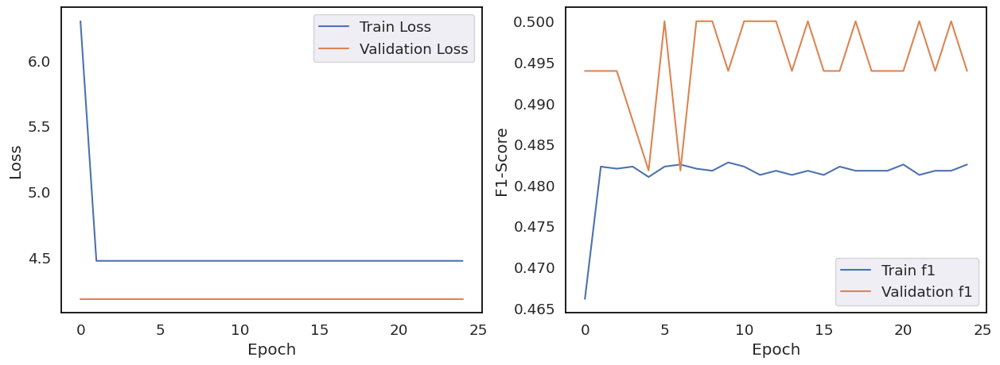

In [165]:
plot_learning_curve(baseline_VGG.history.history['loss'], baseline_VGG.history.history['val_loss'],
                     baseline_VGG.history.history['f1'],baseline_VGG.history.history['val_f1'],
                     metric_name='f1')

In [166]:
y_val_shape = val_data['encoded_shape'].astype(int).values
y_pred_shape = baseline_VGG.predict(validation_generator_shape)


24/24 [==============================] - 1s 43ms/step


In [167]:
y_val_shape = val_data['encoded_shape'].astype(int).values

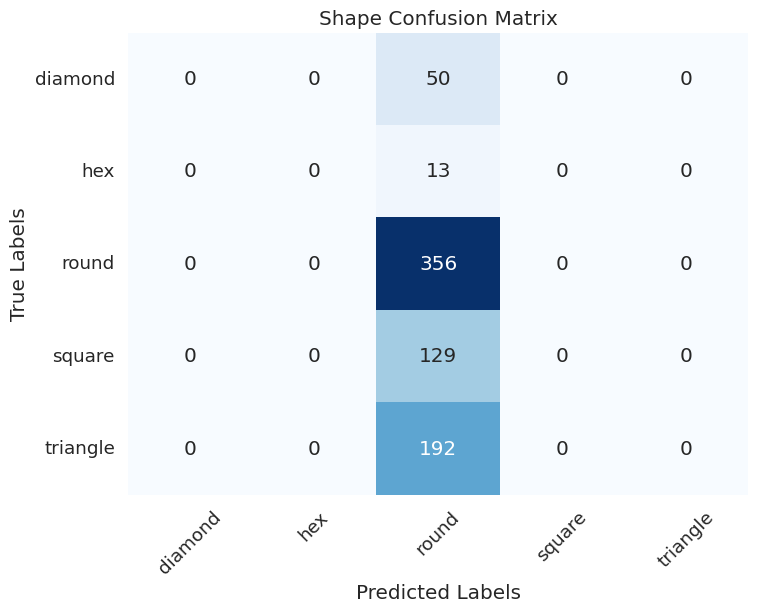

In [168]:
conf_matrix_shape = confusion_matrix(y_val_shape, np.argmax(y_pred_shape, axis=1))
plot_confusion_matrix(conf_matrix_shape, class_names=['diamond', 'hex', 'round', 'square', 'triangle'],
                      title='Shape Confusion Matrix')

In [169]:
class_names = ['diamond', 'hex', 'round', 'square', 'triangle']  # List of class names
report = classification_report(y_val_shape, np.argmax(y_pred_shape, axis=1), target_names=class_names)

# Print the classification report
print(report)

              precision    recall  f1-score   support

     diamond       0.00      0.00      0.00        50
         hex       0.00      0.00      0.00        13
       round       0.48      1.00      0.65       356
      square       0.00      0.00      0.00       129
    triangle       0.00      0.00      0.00       192

    accuracy                           0.48       740
   macro avg       0.10      0.20      0.13       740
weighted avg       0.23      0.48      0.31       740



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Smote Model


In [170]:
train_data_smote['encoded_shape'] = train_data_smote['encoded_shape'].astype('str')
val_data_smote['encoded_shape'] = val_data_smote['encoded_shape'].astype('str')

In [171]:
train_datagen_smote = ImageDataGenerator(rescale=1./255, data_format='channels_last')
val_datagen_smote = ImageDataGenerator(rescale=1./255, data_format='channels_last')

batch_size = 32

train_generator_shape_smote = train_datagen_smote.flow_from_dataframe(
        dataframe=train_data_smote,
        directory='./',
        x_col="image name",
        y_col="encoded_shape",
        target_size=(28, 28),
        batch_size=batch_size,
        class_mode='categorical')

validation_generator_shape_smote = val_datagen_smote.flow_from_dataframe(
        dataframe=val_data_smote,
        directory='./',
        x_col="image name",
        y_col="encoded_shape",
        target_size=(28, 28),
        batch_size=batch_size,
        class_mode='categorical')

Found 6751 validated image filenames belonging to 5 classes.
Found 1688 validated image filenames belonging to 5 classes.


In [172]:
OUTPUT_CLASSES = 5

In [173]:
reg_lambda = 0.001
OUTPUT_ClASSES = 5

smote_VGG = tf.keras.Sequential([
    #VGG block 1
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same',
                           kernel_regularizer=tf.keras.regularizers.l2(reg_lambda), input_shape=(28, 28, 3)),
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same',
                           kernel_regularizer=tf.keras.regularizers.l2(reg_lambda)),
    tf.keras.layers.MaxPooling2D((2, 2)),

    #VGG block 2
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same',
                           kernel_regularizer=tf.keras.regularizers.l2(reg_lambda)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same',
                           kernel_regularizer=tf.keras.regularizers.l2(reg_lambda)),
    tf.keras.layers.MaxPooling2D((2, 2)),

    #VGG block 3
    tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same',
                           kernel_regularizer=tf.keras.regularizers.l2(reg_lambda)),
    tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same',
                           kernel_regularizer=tf.keras.regularizers.l2(reg_lambda)),
    tf.keras.layers.MaxPooling2D((2, 2)),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(.2),
    tf.keras.layers.Dense(OUTPUT_CLASSES),
])

In [174]:
smote_VGG.compile(loss='categorical_crossentropy',
          optimizer= "adam",
          metrics=[f1])

In [175]:
history_smote = smote_VGG.fit_generator(train_generator_shape_smote, validation_data = validation_generator_shape_smote, epochs=25, verbose=2)

Epoch 1/25


<ipython-input-175-b41e64bb0eb4>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history_smote = smote_VGG.fit_generator(train_generator_shape_smote, validation_data = validation_generator_shape_smote, epochs=25, verbose=2)


211/211 - 45s - loss: 8.4683 - f1: 0.1690 - val_loss: 7.4719 - val_f1: 0.2256 - 45s/epoch - 214ms/step
Epoch 2/25
211/211 - 42s - loss: 8.5000 - f1: 0.1422 - val_loss: 4.4531 - val_f1: 0.1337 - 42s/epoch - 201ms/step
Epoch 3/25
211/211 - 41s - loss: 7.5365 - f1: 0.1294 - val_loss: 4.4093 - val_f1: 0.1338 - 41s/epoch - 196ms/step
Epoch 4/25
211/211 - 41s - loss: 6.7394 - f1: 0.1294 - val_loss: 4.4382 - val_f1: 0.1342 - 41s/epoch - 193ms/step
Epoch 5/25
211/211 - 38s - loss: 8.0158 - f1: 0.2285 - val_loss: 10.0719 - val_f1: 0.2538 - 38s/epoch - 180ms/step
Epoch 6/25
211/211 - 38s - loss: 8.7482 - f1: 0.2517 - val_loss: 10.0576 - val_f1: 0.2545 - 38s/epoch - 181ms/step
Epoch 7/25
211/211 - 40s - loss: 8.8560 - f1: 0.2519 - val_loss: 10.0471 - val_f1: 0.2542 - 40s/epoch - 190ms/step
Epoch 8/25
211/211 - 43s - loss: 9.6358 - f1: 0.2516 - val_loss: 10.0389 - val_f1: 0.2545 - 43s/epoch - 204ms/step
Epoch 9/25
211/211 - 38s - loss: 8.9460 - f1: 0.2325 - val_loss: 8.9057 - val_f1: 0.2257 - 38s/

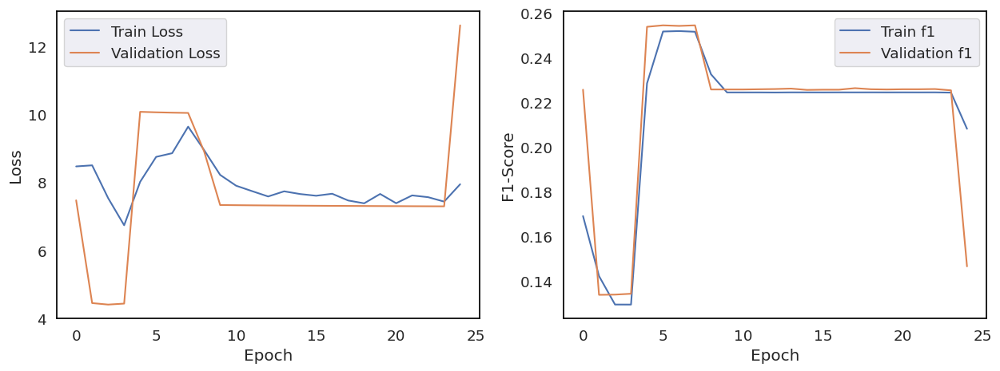

In [176]:
plot_learning_curve(smote_VGG.history.history['loss'], smote_VGG.history.history['val_loss'],
                     smote_VGG.history.history['f1'],smote_VGG.history.history['val_f1'],
                     metric_name='f1')

In [177]:
y_val_shape_smote = val_data_smote['encoded_shape'].astype(int).values


In [178]:

y_pred_shape_smote = smote_VGG.predict(validation_generator_shape_smote)


53/53 [==============================] - 4s 74ms/step


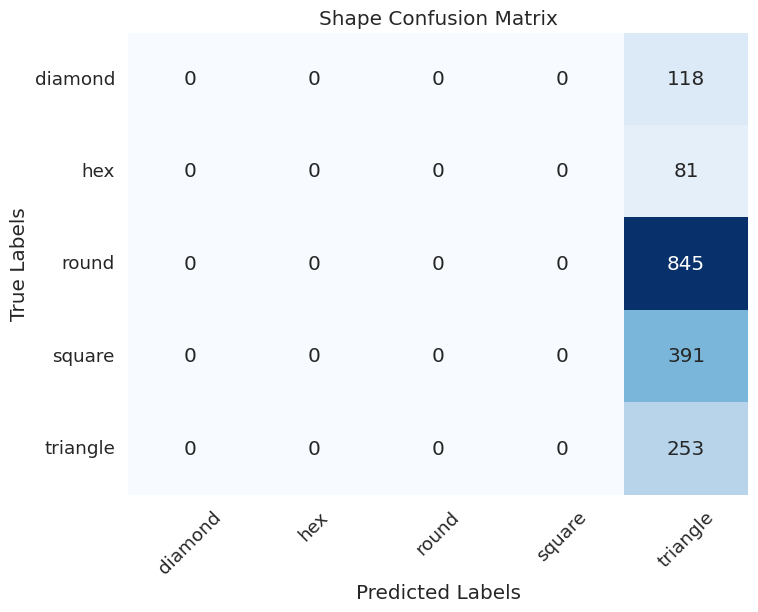

In [179]:
# For shape
conf_matrix_shape_smote = confusion_matrix(y_val_shape_smote, np.argmax(y_pred_shape_smote, axis=1))
plot_confusion_matrix(conf_matrix_shape_smote, class_names=['diamond', 'hex', 'round', 'square', 'triangle'],
                      title='Shape Confusion Matrix')

In [180]:
class_names = ['diamond', 'hex', 'round', 'square', 'triangle']  # List of class names
report = classification_report(y_val_shape_smote, np.argmax(y_pred_shape_smote, axis=1), target_names=class_names)

# Print the classification report
print(report)

              precision    recall  f1-score   support

     diamond       0.00      0.00      0.00       118
         hex       0.00      0.00      0.00        81
       round       0.00      0.00      0.00       845
      square       0.00      0.00      0.00       391
    triangle       0.15      1.00      0.26       253

    accuracy                           0.15      1688
   macro avg       0.03      0.20      0.05      1688
weighted avg       0.02      0.15      0.04      1688



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



## Edge Detection Model

We decided to test if the model will improve with edge detection implemented

In [181]:
df_processed_edge.head()

,edges,image_path,edge_shape,edge_shape_type,encoded_edge_shape,encoded_edge_type
0,[[ 0 0 0 0 0 0 0 0 0 0 0 ...,processed_images/0.png,hex,stop,1,12
1,[[ 0 0 0 0 0 0 0 0 0 0 0 ...,processed_images/1.png,hex,stop,1,12
2,[[ 0 0 0 0 0 0 0 0 0 0 0 ...,processed_images/2.png,hex,stop,1,12
3,[[ 0 0 0 0 0 0 0 0 0 0 255 ...,processed_images/3.png,hex,stop,1,12
4,[[ 0 0 0 0 0 0 0 0 0 0 0 ...,processed_images/4.png,hex,stop,1,12


In [182]:
edge_train_data, edge_val_data = train_test_split(df_processed_edge, test_size=0.2, random_state=45)
print("Train data : {}, Val Data: {}".format(edge_train_data.shape[0], edge_val_data.shape[0]))

Train data : 2959, Val Data: 740


In [183]:
edge_train_data['encoded_edge_shape'] = edge_train_data['encoded_edge_shape'].astype(str)
edge_val_data['encoded_edge_shape'] = edge_val_data['encoded_edge_shape'].astype(str)


In [184]:
df_processed_edge = df_processed_edge.astype(str)


In [185]:
df_processed_edge.dtypes

edges                 object
image_path            object
edge_shape            object
edge_shape_type       object
encoded_edge_shape    object
encoded_edge_type     object
dtype: object

In [186]:
train_datagen_edge = ImageDataGenerator(rescale=1./255, data_format='channels_last')
val_datagen_edge = ImageDataGenerator(rescale=1./255, data_format='channels_last')

batch_size = 32

train_generator_shape_edge = train_datagen_edge.flow_from_dataframe(
        dataframe=edge_train_data,
        directory='./',
        x_col="image_path",
        y_col="encoded_edge_shape",
        target_size=(28, 28),
        batch_size=batch_size,
        class_mode='categorical')

validation_generator_shape_edge = val_datagen_edge.flow_from_dataframe(
        dataframe=edge_val_data,
        directory='./',
        x_col="image_path",
        y_col="encoded_edge_shape",
        target_size=(28, 28),
        batch_size=batch_size,
        class_mode='categorical')


Found 2959 validated image filenames belonging to 5 classes.
Found 740 validated image filenames belonging to 5 classes.


In [187]:
OUTPUT_CLASSES = 5
edge_VGG = tf.keras.Sequential([
    #VGG block 1
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(28, 28, 3)),
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
    tf.keras.layers.MaxPooling2D((2, 2)),

    #VGG block 2
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
    tf.keras.layers.MaxPooling2D((2, 2)),

    #VGG block 3
    tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
    tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
    tf.keras.layers.MaxPooling2D((2, 2)),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(OUTPUT_CLASSES),
])

In [188]:
edge_VGG.compile(loss='categorical_crossentropy',
          optimizer= "adam",
          metrics=[f1])

In [189]:
history_edge_VGG = edge_VGG.fit_generator(train_generator_shape_edge, validation_data = validation_generator_shape_edge, epochs=25, verbose=2)

Epoch 1/25


<ipython-input-189-581b44fddf13>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history_edge_VGG = edge_VGG.fit_generator(train_generator_shape_edge, validation_data = validation_generator_shape_edge, epochs=25, verbose=2)


93/93 - 20s - loss: 11.8980 - f1: 0.3962 - val_loss: 13.0252 - val_f1: 0.4076 - 20s/epoch - 218ms/step
Epoch 2/25
93/93 - 18s - loss: 12.9097 - f1: 0.4007 - val_loss: 13.0252 - val_f1: 0.4076 - 18s/epoch - 196ms/step
Epoch 3/25
93/93 - 18s - loss: 12.9097 - f1: 0.4009 - val_loss: 13.0252 - val_f1: 0.4030 - 18s/epoch - 189ms/step
Epoch 4/25
93/93 - 17s - loss: 12.9097 - f1: 0.4007 - val_loss: 13.0252 - val_f1: 0.3893 - 17s/epoch - 188ms/step
Epoch 5/25
93/93 - 17s - loss: 12.9097 - f1: 0.4009 - val_loss: 13.0252 - val_f1: 0.4030 - 17s/epoch - 187ms/step
Epoch 6/25
93/93 - 21s - loss: 12.9097 - f1: 0.4005 - val_loss: 13.0252 - val_f1: 0.4076 - 21s/epoch - 222ms/step
Epoch 7/25
93/93 - 17s - loss: 12.9097 - f1: 0.4007 - val_loss: 13.0252 - val_f1: 0.3984 - 17s/epoch - 188ms/step
Epoch 8/25
93/93 - 21s - loss: 12.9097 - f1: 0.4007 - val_loss: 13.0252 - val_f1: 0.3984 - 21s/epoch - 229ms/step
Epoch 9/25
93/93 - 17s - loss: 12.9097 - f1: 0.4003 - val_loss: 13.0252 - val_f1: 0.4076 - 17s/epoc

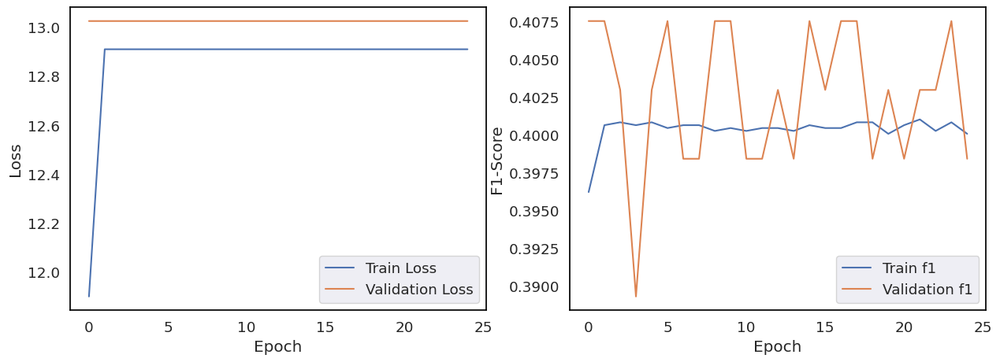

In [190]:
plot_learning_curve(history_edge_VGG.history['loss'], history_edge_VGG.history['val_loss'],
                    history_edge_VGG.history['f1'], history_edge_VGG.history['val_f1'],
                    metric_name='f1')

In [191]:
y_val_shape_edge = edge_val_data['encoded_edge_shape'].astype(int).values


In [192]:

y_pred_shape_edge = edge_VGG.predict(validation_generator_shape_edge)


24/24 [==============================] - 1s 43ms/step


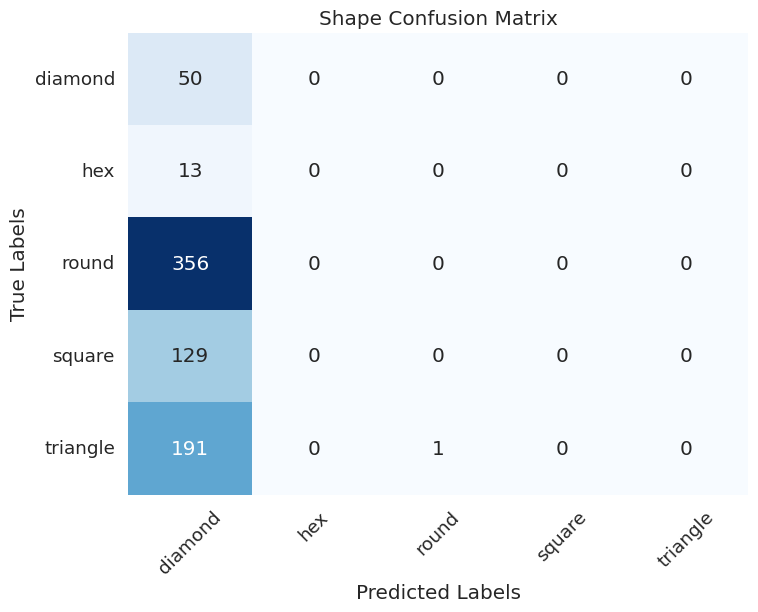

In [193]:
conf_matrix_shape_edge = confusion_matrix(y_val_shape_edge, np.argmax(y_pred_shape_edge, axis=1))
plot_confusion_matrix(conf_matrix_shape_edge, class_names=['diamond', 'hex', 'round', 'square', 'triangle'],
                      title='Shape Confusion Matrix')

In [194]:
class_names = ['diamond', 'hex', 'round', 'square', 'triangle']  # List of class names
report = classification_report(y_val_shape_edge, np.argmax(y_pred_shape_edge, axis=1), target_names=class_names)

# Print the classification report
print(report)

              precision    recall  f1-score   support

     diamond       0.07      1.00      0.13        50
         hex       0.00      0.00      0.00        13
       round       0.00      0.00      0.00       356
      square       0.00      0.00      0.00       129
    triangle       0.00      0.00      0.00       192

    accuracy                           0.07       740
   macro avg       0.01      0.20      0.03       740
weighted avg       0.00      0.07      0.01       740



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## CNN Model Experiment
Trying a different arrangement of convolutional layers, activation functions, batch normalization layers, and max-pooling layers.

### Baseline CNN Model Experiment

In [198]:
inputShape = (28, 28, 1)
classes = 5
chanDim = -1

# Create the model
model = Sequential([
    layers.Conv2D(16, (3, 3), padding="same"),
    layers.Activation("relu"),
    layers.BatchNormalization(axis=chanDim),
    layers.Conv2D(16, (3, 3), padding="same"),
    layers.Activation("relu"),
    layers.BatchNormalization(axis=chanDim),
    layers.MaxPooling2D(pool_size=(2, 2)),
    layers.Conv2D(32, (3, 3), padding="same"),
    layers.Activation("relu"),
    layers.BatchNormalization(axis=chanDim),
    layers.Conv2D(32, (3, 3), padding="same"),
    layers.Activation("relu"),
    layers.BatchNormalization(axis=chanDim),
    layers.MaxPooling2D(pool_size=(2, 2)),
    layers.Flatten(),
    layers.Dense(128),
    layers.Activation("relu"),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Flatten(),
    layers.Dense(128),
    layers.Activation("relu"),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(classes),
    layers.Activation("softmax")
])


In [199]:
def load_split(dataframe):
    data = []
    labels = []

    # Shuffle dataframe rows
    dataframe = dataframe.sample(frac=1).reset_index(drop=True)

    for i, row in dataframe.iterrows():
        # Progress update
        if i > 0 and i % 1000 == 0:
            print("[INFO] processed {} total images".format(i))

        # Extract image path and label from dataframe row
        imagePath = row['image name']
        label = row['encoded_shape']

        # Load and preprocess image
        image = io.imread(imagePath)
        image = transform.resize(image, (28, 28))
        image = exposure.equalize_adapthist(image, clip_limit=0.1)

        # Update data and labels lists
        data.append(image)
        labels.append(int(label))

    # Convert lists to NumPy arrays
    data = np.array(data)
    labels = np.array(labels)

    # Return data and labels as a tuple
    return data, labels


In [242]:
(dataX, dataY) = load_split(df_train)


[INFO] processed 1000 total images
[INFO] processed 2000 total images
[INFO] processed 3000 total images


In [243]:
# Split data into 80% training and 20% validation
trainX, valX, trainY, valY = train_test_split(dataX, dataY, test_size=0.2, random_state=42)

# Print the shapes of the resulting arrays
print("Training data shapes:", trainX.shape, trainY.shape)
print("Validation data shapes:", valX.shape, valY.shape)


Training data shapes: (2959, 28, 28) (2959,)
Validation data shapes: (740, 28, 28) (740,)


In [244]:
# scale data to the range of [0, 1]
trainX = trainX.astype("float32") / 255.0
valX = valX.astype("float32") / 255.0

In [245]:
numLabels = len(np.unique(trainY))
trainY = to_categorical(trainY, numLabels)
valY = to_categorical(valY, numLabels)
print(trainY)

[[0. 0. 1. 0. 0.]
 [0. 0. 1. 0. 0.]
 [0. 0. 0. 1. 0.]
 ...
 [0. 0. 1. 0. 0.]
 [0. 0. 1. 0. 0.]
 [1. 0. 0. 0. 0.]]


In [246]:
trainX = trainX.reshape(2959, 28, 28, 1)
valX = valX.reshape(740, 28, 28, 1)


In [205]:
# initialize a dictionary to store the class weights
classTotals = trainY.sum(axis=0)
classWeight = dict()
# loop over all classes and calculate the class weight
for i in range(0, len(classTotals)):
	classWeight[i] = classTotals.max() / classTotals[i]

In [206]:
print(classWeight)

{0: 6.4681816, 1: 39.52778, 2: 1.0, 3: 2.5967152, 4: 1.943989}


In [207]:
NUM_EPOCHS = 100
INIT_LR = 1e-3
BS = 64
opt = Adam(learning_rate=INIT_LR)

model.compile(loss='categorical_crossentropy',
          optimizer= "adam",
          metrics=[f1])

In [208]:
# Train the network
print("[INFO] training network...")
vgg_1 = model.fit(
    trainX, trainY,
    validation_data=(valX, valY),
    batch_size=BS,
    epochs=NUM_EPOCHS,
    class_weight=classWeight,
    verbose=1
)

[INFO] training network...
Epoch 1/100
47/47 [==============================] - 13s 177ms/step - loss: 3.2271 - f1: 0.4200 - val_loss: 1.8149 - val_f1: 0.0000e+00
Epoch 2/100
47/47 [==============================] - 8s 173ms/step - loss: 1.3976 - f1: 0.6974 - val_loss: 2.3350 - val_f1: 0.0091
Epoch 3/100
47/47 [==============================] - 6s 120ms/step - loss: 0.9802 - f1: 0.8145 - val_loss: 3.5629 - val_f1: 0.0091
Epoch 4/100
47/47 [==============================] - 8s 176ms/step - loss: 0.5556 - f1: 0.8931 - val_loss: 5.7232 - val_f1: 0.0091
Epoch 5/100
47/47 [==============================] - 6s 120ms/step - loss: 0.3568 - f1: 0.9287 - val_loss: 7.2599 - val_f1: 0.0091
Epoch 6/100
47/47 [==============================] - 6s 120ms/step - loss: 0.2138 - f1: 0.9604 - val_loss: 8.8206 - val_f1: 0.0091
Epoch 7/100
47/47 [==============================] - 8s 173ms/step - loss: 0.1995 - f1: 0.9680 - val_loss: 11.3725 - val_f1: 0.0091
Epoch 8/100
47/47 [==============================]

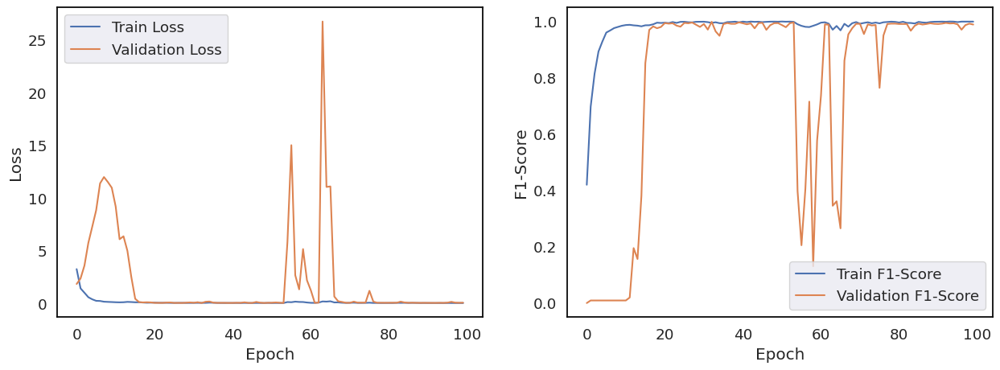

In [209]:
plot_learning_curve(vgg_1.history['loss'], vgg_1.history['val_loss'], vgg_1.history['f1'], vgg_1.history['val_f1'], "F1-Score" )

In [212]:
# Get the predicted labels for the test set
predictions = model.predict(valX)
predicted_labels = np.argmax(predictions, axis=1)

# Convert one-hot encoded test labels back to integers
true_labels = np.argmax(valY, axis=1)

# Generate classification report
report = classification_report(true_labels, predicted_labels)
print(report)

24/24 [==============================] - 1s 30ms/step
              precision    recall  f1-score   support

           0       1.00      0.98      0.99        62
           1       1.00      1.00      1.00         7
           2       0.99      0.99      0.99       337
           3       0.97      1.00      0.98       140
           4       1.00      0.99      0.99       194

    accuracy                           0.99       740
   macro avg       0.99      0.99      0.99       740
weighted avg       0.99      0.99      0.99       740



In [213]:
# Convert the predicted values to a multi-label indicator matrix
predicted_labels_multilabel = to_categorical(predicted_labels)

# Generate classification report
print(classification_report(valY, predicted_labels_multilabel, target_names=['diamond', 'hex', 'round', 'square', 'triangle']))

              precision    recall  f1-score   support

     diamond       1.00      0.98      0.99        62
         hex       1.00      1.00      1.00         7
       round       0.99      0.99      0.99       337
      square       0.97      1.00      0.98       140
    triangle       1.00      0.99      0.99       194

   micro avg       0.99      0.99      0.99       740
   macro avg       0.99      0.99      0.99       740
weighted avg       0.99      0.99      0.99       740
 samples avg       0.99      0.99      0.99       740



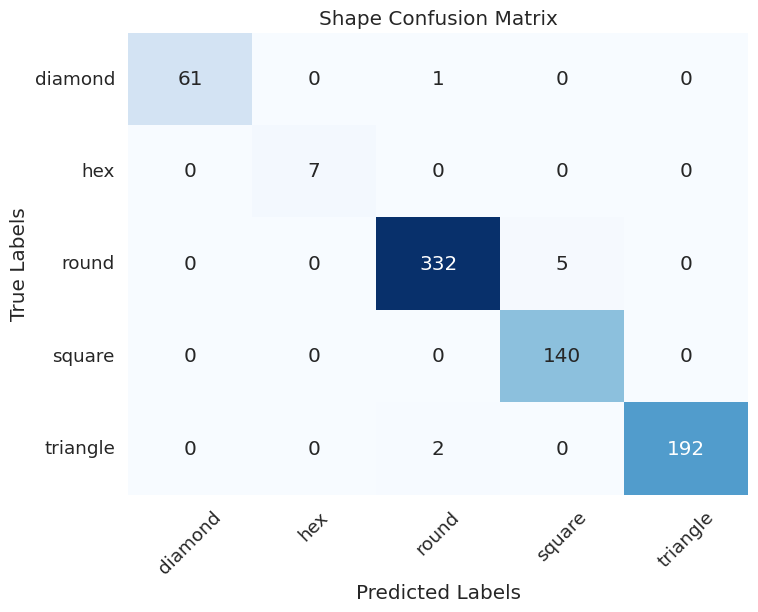

In [214]:
conf_matrix_shape = confusion_matrix(true_labels, predicted_labels)
plot_confusion_matrix(conf_matrix_shape, class_names=['diamond', 'hex', 'round', 'square', 'triangle'],
                      title='Shape Confusion Matrix')

## regularisation
* Using a regularisation parameter of 0.001
* Tuning regularisation parameter

In [215]:
chanDim = -1
classes = 5
# Create the model with regularization
shape_model_2 = Sequential([
    layers.Conv2D(16, (3, 3), padding="same", kernel_regularizer=regularizers.l2(0.001)),
    layers.Activation("relu"),
    layers.BatchNormalization(axis=chanDim),
    layers.Conv2D(16, (3, 3), padding="same", kernel_regularizer=regularizers.l2(0.001)),
    layers.Activation("relu"),
    layers.BatchNormalization(axis=chanDim),
    layers.MaxPooling2D(pool_size=(2, 2)),
    layers.Dropout(0.25),  # Add dropout layer
    layers.Conv2D(32, (3, 3), padding="same", kernel_regularizer=regularizers.l2(0.001)),
    layers.Activation("relu"),
    layers.BatchNormalization(axis=chanDim),
    layers.Conv2D(32, (3, 3), padding="same", kernel_regularizer=regularizers.l2(0.001)),
    layers.Activation("relu"),
    layers.BatchNormalization(axis=chanDim),
    layers.MaxPooling2D(pool_size=(2, 2)),
    layers.Dropout(0.25),  # Add dropout layer
    layers.Flatten(),
    layers.Dense(128, kernel_regularizer=regularizers.l2(0.001)),
    layers.Activation("relu"),
    layers.BatchNormalization(),
    layers.Dropout(0.5),  # Add dropout layer
    layers.Dense(128, kernel_regularizer=regularizers.l2(0.001)),
    layers.Activation("relu"),
    layers.BatchNormalization(),
    layers.Dropout(0.5),  # Add dropout layer
    layers.Dense(classes),
    layers.Activation("softmax")
])


In [216]:
NUM_EPOCHS = 100
INIT_LR = 1e-3
BS = 64

shape_model_2.compile(loss="categorical_crossentropy", optimizer="adam", metrics=[f1])


# Train the network
print("[INFO] training network...")
H = shape_model_2.fit(
    trainX, trainY,
    validation_data=(valX, valY),
    batch_size=BS,
    epochs=NUM_EPOCHS,
    class_weight=classWeight,
    verbose=1
)

[INFO] training network...
Epoch 1/100
47/47 [==============================] - 10s 123ms/step - loss: 4.4646 - f1: 0.3485 - val_loss: 2.2170 - val_f1: 0.0000e+00
Epoch 2/100
47/47 [==============================] - 10s 207ms/step - loss: 2.5614 - f1: 0.5422 - val_loss: 2.7830 - val_f1: 0.0000e+00
Epoch 3/100
47/47 [==============================] - 10s 206ms/step - loss: 1.8212 - f1: 0.6831 - val_loss: 4.2355 - val_f1: 0.0091
Epoch 4/100
47/47 [==============================] - 5s 115ms/step - loss: 1.3575 - f1: 0.7872 - val_loss: 6.3180 - val_f1: 0.0091
Epoch 5/100
47/47 [==============================] - 9s 184ms/step - loss: 1.2174 - f1: 0.8239 - val_loss: 7.7457 - val_f1: 0.0091
Epoch 6/100
47/47 [==============================] - 6s 122ms/step - loss: 1.0131 - f1: 0.8815 - val_loss: 10.4210 - val_f1: 0.0091
Epoch 7/100
47/47 [==============================] - 7s 146ms/step - loss: 0.8970 - f1: 0.9040 - val_loss: 11.2563 - val_f1: 0.0091
Epoch 8/100
47/47 [========================

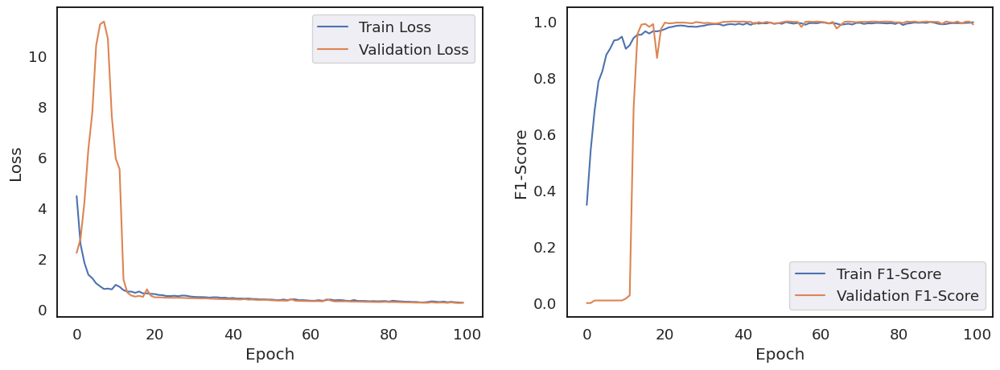

In [217]:
plot_learning_curve(H.history['loss'], H.history['val_loss'], H.history['f1'], H.history['val_f1'], "F1-Score" )

In [218]:
# Get the predicted labels for the test set
predictions_2 = shape_model_2.predict(valX)
predicted_labels_2 = np.argmax(predictions_2, axis=1)

# Convert one-hot encoded test labels back to integers
true_labels_2 = np.argmax(valY, axis=1)

# Generate classification report
report = classification_report(true_labels, predicted_labels_2)
print(report)



24/24 [==============================] - 1s 20ms/step
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        62
           1       1.00      1.00      1.00         7
           2       1.00      0.99      0.99       337
           3       1.00      0.97      0.99       140
           4       0.97      1.00      0.98       194

    accuracy                           0.99       740
   macro avg       0.99      0.99      0.99       740
weighted avg       0.99      0.99      0.99       740



In [219]:
# Convert the predicted values to a multi-label indicator matrix
predicted_labels_multilabel_2 = to_categorical(predicted_labels_2)

# Generate classification report
print(classification_report(valY, predicted_labels_multilabel_2, target_names=['diamond', 'hex', 'round', 'square', 'triangle']))

              precision    recall  f1-score   support

     diamond       0.98      1.00      0.99        62
         hex       1.00      1.00      1.00         7
       round       1.00      0.99      0.99       337
      square       1.00      0.97      0.99       140
    triangle       0.97      1.00      0.98       194

   micro avg       0.99      0.99      0.99       740
   macro avg       0.99      0.99      0.99       740
weighted avg       0.99      0.99      0.99       740
 samples avg       0.99      0.99      0.99       740



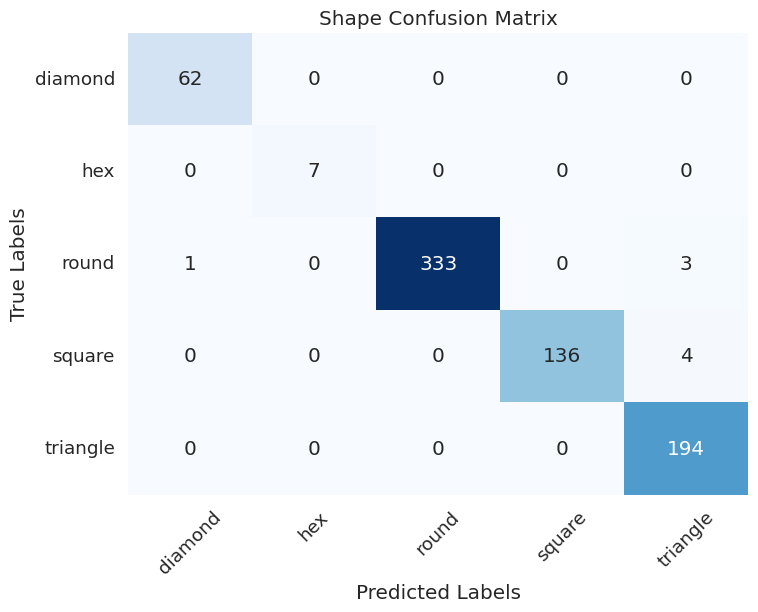

In [220]:
conf_matrix_shape = confusion_matrix(true_labels_2, predicted_labels_2)
plot_confusion_matrix(conf_matrix_shape, class_names=['diamond', 'hex', 'round', 'square', 'triangle'],
                      title='Shape Confusion Matrix')

### Tuning regularisation parameter

In [221]:
def create_model(reg_param):
    model = Sequential([
        layers.Conv2D(16, (3, 3), padding="same", kernel_regularizer=regularizers.l2(reg_param)),
        layers.Activation("relu"),
        layers.BatchNormalization(axis=chanDim),
        layers.Conv2D(16, (3, 3), padding="same", kernel_regularizer=regularizers.l2(reg_param)),
        layers.Activation("relu"),
        layers.BatchNormalization(axis=chanDim),
        layers.MaxPooling2D(pool_size=(2, 2)),
        layers.Dropout(0.25),  # Add dropout layer
        layers.Conv2D(32, (3, 3), padding="same", kernel_regularizer=regularizers.l2(reg_param)),
        layers.Activation("relu"),
        layers.BatchNormalization(axis=chanDim),
        layers.Conv2D(32, (3, 3), padding="same", kernel_regularizer=regularizers.l2(reg_param)),
        layers.Activation("relu"),
        layers.BatchNormalization(axis=chanDim),
        layers.MaxPooling2D(pool_size=(2, 2)),
        layers.Dropout(0.25),  # Add dropout layer
        layers.Flatten(),
        layers.Dense(128, kernel_regularizer=regularizers.l2(reg_param)),
        layers.Activation("relu"),
        layers.BatchNormalization(),
        layers.Dropout(0.5),  # Add dropout layer
        layers.Dense(128, kernel_regularizer=regularizers.l2(reg_param)),
        layers.Activation("relu"),
        layers.BatchNormalization(),
        layers.Dropout(0.5),  # Add dropout layer
        layers.Dense(classes),
        layers.Activation("softmax")
    ])
    model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=[f1])
    return model


In [222]:
regularization_params = [0.001, 0.01, 0.1]

# Placeholder for the best model and its score
best_model = None
best_score = -np.inf
best_reg_param = None

# Iterate over the regularization parameters
for reg_param in regularization_params:
    print(f"[INFO] training network with regularization parameter: {reg_param}")
    model = create_model(reg_param)

    H = model.fit(
        trainX, trainY,
        validation_data=(valX, valY),
        batch_size=BS,
        epochs=NUM_EPOCHS,
        class_weight=classWeight,
        verbose=1
    )
    # Evaluate the model
    predictions = model.predict(valX, batch_size=BS)
    predicted_classes = np.argmax(predictions, axis=1)
    true_classes = np.argmax(valY, axis=1)
    score = f1_score(true_classes, predicted_classes, average='weighted')

    print(f"F1 Score for regularization parameter {reg_param}: {score}")

    # Check if this model is the best one
    if score > best_score:
        best_score = score
        best_model = model
        best_reg_param = reg_param

print(f"Best regularization parameter: {best_reg_param}")
print(f"Best F1 Score: {best_score}")

[INFO] training network with regularization parameter: 0.001
Epoch 1/100
47/47 [==============================] - 9s 131ms/step - loss: 5.1969 - f1: 0.2748 - val_loss: 2.7149 - val_f1: 0.0000e+00
Epoch 2/100
47/47 [==============================] - 8s 178ms/step - loss: 2.9711 - f1: 0.4876 - val_loss: 3.0754 - val_f1: 0.0000e+00
Epoch 3/100
47/47 [==============================] - 5s 115ms/step - loss: 2.0773 - f1: 0.6423 - val_loss: 3.1543 - val_f1: 0.0848
Epoch 4/100
47/47 [==============================] - 7s 148ms/step - loss: 1.5497 - f1: 0.7469 - val_loss: 3.8483 - val_f1: 0.0848
Epoch 5/100
47/47 [==============================] - 7s 154ms/step - loss: 1.3130 - f1: 0.8291 - val_loss: 3.8797 - val_f1: 0.0848
Epoch 6/100
47/47 [==============================] - 6s 121ms/step - loss: 1.0718 - f1: 0.8726 - val_loss: 4.3901 - val_f1: 0.0848
Epoch 7/100
47/47 [==============================] - 9s 197ms/step - loss: 1.0065 - f1: 0.8913 - val_loss: 4.8346 - val_f1: 0.0848
Epoch 8/100
47

### Regularised Model with Regularisation of 0.1

In [224]:
chanDim = -1
classes = 5
# Create the model with regularization
shape_model_reg = Sequential([
    layers.Conv2D(16, (3, 3), padding="same", kernel_regularizer=regularizers.l2(0.1)),
    layers.Activation("relu"),
    layers.BatchNormalization(axis=chanDim),
    layers.Conv2D(16, (3, 3), padding="same", kernel_regularizer=regularizers.l2(0.1)),
    layers.Activation("relu"),
    layers.BatchNormalization(axis=chanDim),
    layers.MaxPooling2D(pool_size=(2, 2)),
    layers.Dropout(0.25),  # Add dropout layer
    layers.Conv2D(32, (3, 3), padding="same", kernel_regularizer=regularizers.l2(0.1)),
    layers.Activation("relu"),
    layers.BatchNormalization(axis=chanDim),
    layers.Conv2D(32, (3, 3), padding="same", kernel_regularizer=regularizers.l2(0.1)),
    layers.Activation("relu"),
    layers.BatchNormalization(axis=chanDim),
    layers.MaxPooling2D(pool_size=(2, 2)),
    layers.Dropout(0.25),  # Add dropout layer
    layers.Flatten(),
    layers.Dense(128, kernel_regularizer=regularizers.l2(0.1)),
    layers.Activation("relu"),
    layers.BatchNormalization(),
    layers.Dropout(0.5),  # Add dropout layer
    layers.Dense(128, kernel_regularizer=regularizers.l2(0.1)),
    layers.Activation("relu"),
    layers.BatchNormalization(),
    layers.Dropout(0.5),  # Add dropout layer
    layers.Dense(classes),
    layers.Activation("softmax")
])


In [225]:
NUM_EPOCHS = 100
INIT_LR = 1e-3
BS = 64

shape_model_reg.compile(loss="categorical_crossentropy", optimizer="adam", metrics=[f1])


# Train the network
print("[INFO] training network...")
history_reg = shape_model_reg.fit(
    trainX, trainY,
    validation_data=(valX, valY),
    batch_size=BS,
    epochs=NUM_EPOCHS,
    class_weight=classWeight,
    verbose=1
)

[INFO] training network...
Epoch 1/100
47/47 [==============================] - 24s 292ms/step - loss: 43.8555 - f1: 0.3247 - val_loss: 37.8944 - val_f1: 0.0000e+00
Epoch 2/100
47/47 [==============================] - 10s 214ms/step - loss: 34.1823 - f1: 0.5993 - val_loss: 30.9196 - val_f1: 0.0091
Epoch 3/100
47/47 [==============================] - 13s 279ms/step - loss: 26.8672 - f1: 0.7438 - val_loss: 25.3214 - val_f1: 0.0091
Epoch 4/100
47/47 [==============================] - 11s 242ms/step - loss: 21.1655 - f1: 0.8285 - val_loss: 20.8956 - val_f1: 0.0091
Epoch 5/100
47/47 [==============================] - 11s 223ms/step - loss: 16.8071 - f1: 0.8863 - val_loss: 16.9772 - val_f1: 0.0091
Epoch 6/100
47/47 [==============================] - 13s 279ms/step - loss: 13.5168 - f1: 0.8963 - val_loss: 14.1004 - val_f1: 0.0091
Epoch 7/100
47/47 [==============================] - 13s 289ms/step - loss: 10.9284 - f1: 0.9190 - val_loss: 11.3949 - val_f1: 0.0000e+00
Epoch 8/100
47/47 [========

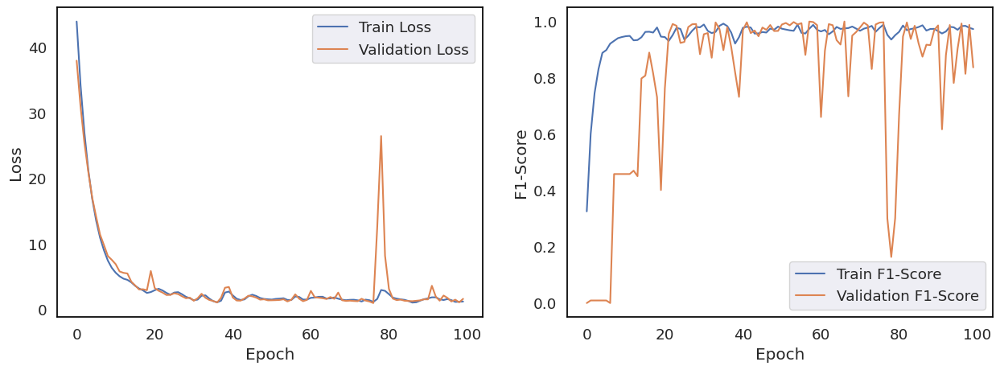

In [226]:
plot_learning_curve(history_reg.history['loss'], history_reg.history['val_loss'], history_reg.history['f1'], history_reg.history['val_f1'], "F1-Score" )

In [227]:
# Get the predicted labels for the test set
predictions_reg = shape_model_reg.predict(valX)
predicted_labels_reg = np.argmax(predictions_reg, axis=1)

# Convert one-hot encoded test labels back to integers
true_labels_reg = np.argmax(valY, axis=1)

# Generate classification report
report = classification_report(true_labels_reg, predicted_labels_reg)
print(report)



24/24 [==============================] - 1s 15ms/step
              precision    recall  f1-score   support

           0       1.00      0.87      0.93        62
           1       1.00      1.00      1.00         7
           2       1.00      0.82      0.90       337
           3       1.00      0.63      0.77       140
           4       0.62      1.00      0.76       194

    accuracy                           0.84       740
   macro avg       0.92      0.86      0.87       740
weighted avg       0.90      0.84      0.84       740



In [228]:
# Convert the predicted values to a multi-label indicator matrix
predicted_labels_multilabel_reg = to_categorical(predicted_labels_reg)

# Generate classification report
print(classification_report(valY, predicted_labels_multilabel_reg, target_names=['diamond', 'hex', 'round', 'square', 'triangle']))

              precision    recall  f1-score   support

     diamond       1.00      0.87      0.93        62
         hex       1.00      1.00      1.00         7
       round       1.00      0.82      0.90       337
      square       1.00      0.63      0.77       140
    triangle       0.62      1.00      0.76       194

   micro avg       0.84      0.84      0.84       740
   macro avg       0.92      0.86      0.87       740
weighted avg       0.90      0.84      0.84       740
 samples avg       0.84      0.84      0.84       740



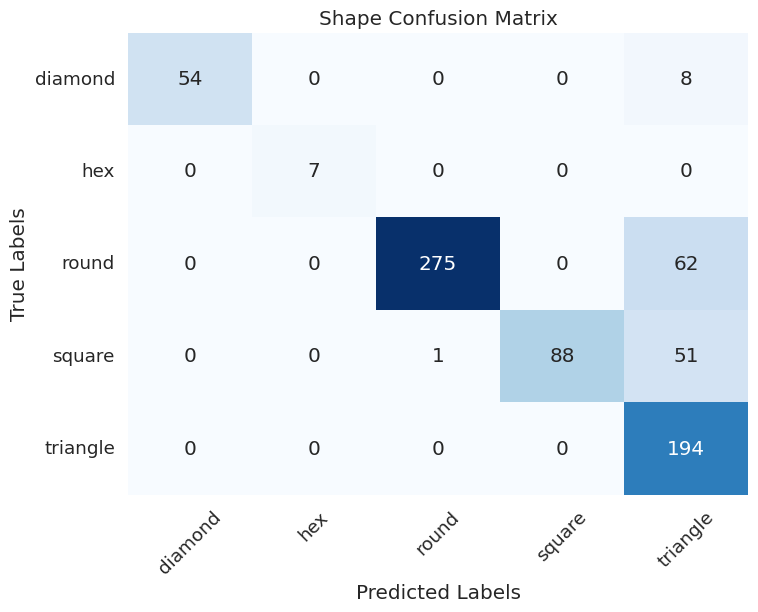

In [229]:
conf_matrix_shape_reg = confusion_matrix(true_labels_reg, predicted_labels_reg)
plot_confusion_matrix(conf_matrix_shape_reg, class_names=['diamond', 'hex', 'round', 'square', 'triangle'],
                      title='Shape Confusion Matrix')

## K fold cross validation and hyperparameter tuning

### Cross Validation and Hyperparameter Tuning
To further test and see how our model is performing, cross validation will be performed as well as hyperparameter tuning

In [234]:
k_folds = 5
kfold = StratifiedKFold(n_splits=k_folds, shuffle=True, random_state=42)

# Lists to store the evaluation results for each fold
f1_scores = []

# Iterate over the folds
for fold, (train_indices, val_indices) in enumerate(kfold.split(trainX, trainY.argmax(axis=1))):
    print(f"Fold {fold+1}/{k_folds}")

    # Create a clone of the model
    shape_model_cv = tf.keras.models.clone_model(shape_model_reg)

    # Compile the model
    shape_model_cv.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[f1])

    # Train the model on this fold
    history_cv = shape_model_cv.fit(
        trainX[train_indices], trainY[train_indices],
        validation_data=(trainX[val_indices], trainY[val_indices]),
        batch_size=BS,
        epochs=NUM_EPOCHS,
        class_weight=classWeight,
        verbose=1
    )

    # Evaluate the model on the validation set for this fold
    _, f1_score = shape_model_cv.evaluate(trainX[val_indices], trainY[val_indices], verbose=0)
    f1_scores.append(f1_score)

# Calculate the mean and standard deviation of the F1 scores
mean_f1 = np.mean(f1_scores)
std_f1 = np.std(f1_scores)
print(f"Mean F1 Score: {mean_f1:.4f}, Std Deviation: {std_f1:.4f}")

Fold 1/5
Epoch 1/100
37/37 [==============================] - 20s 259ms/step - loss: 46.1894 - f1: 0.1747 - val_loss: 38.0822 - val_f1: 0.0000e+00
Epoch 2/100
37/37 [==============================] - 10s 268ms/step - loss: 39.2361 - f1: 0.1443 - val_loss: 32.7689 - val_f1: 0.0000e+00
Epoch 3/100
37/37 [==============================] - 5s 147ms/step - loss: 34.3949 - f1: 0.1249 - val_loss: 28.6364 - val_f1: 0.0000e+00
Epoch 4/100
37/37 [==============================] - 8s 216ms/step - loss: 30.1061 - f1: 0.1132 - val_loss: 25.2581 - val_f1: 0.0000e+00
Epoch 5/100
37/37 [==============================] - 5s 138ms/step - loss: 26.9028 - f1: 0.1159 - val_loss: 22.4063 - val_f1: 0.0000e+00
Epoch 6/100
37/37 [==============================] - 10s 282ms/step - loss: 24.1919 - f1: 0.1004 - val_loss: 20.9589 - val_f1: 0.0203
Epoch 7/100
37/37 [==============================] - 9s 228ms/step - loss: 22.0287 - f1: 0.1032 - val_loss: 19.8125 - val_f1: 0.0203
Epoch 8/100
37/37 [==================

In [263]:
k_folds = 5
kfold = StratifiedKFold(n_splits=k_folds, shuffle=True, random_state=42)

# Lists to store the evaluation results for each fold
f1_scores = []

# Iterate over the folds
for fold, (train_indices, val_indices) in enumerate(kfold.split(trainX, trainY.argmax(axis=1))):
    print(f"Fold {fold+1}/{k_folds}")

    # Create a clone of the model
    shape_model_cv_1 = tf.keras.models.clone_model(shape_model_2)

    # Compile the model
    shape_model_cv_1.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[f1])

    # Train the model on this fold
    history_cv = shape_model_cv_1.fit(
        trainX[train_indices], trainY[train_indices],
        validation_data=(trainX[val_indices], trainY[val_indices]),
        batch_size=BS,
        epochs=NUM_EPOCHS,
        class_weight=classWeight,
        verbose=1
    )

    # Evaluate the model on the validation set for this fold
    _, f1_score = shape_model_cv_1.evaluate(trainX[val_indices], trainY[val_indices], verbose=0)
    f1_scores.append(f1_score)

# Calculate the mean and standard deviation of the F1 scores
mean_f1 = np.mean(f1_scores)
std_f1 = np.std(f1_scores)
print(f"Mean F1 Score: {mean_f1:.4f}, Std Deviation: {std_f1:.4f}")

Fold 1/5
Epoch 1/100
37/37 [==============================] - 16s 277ms/step - loss: 5.0007 - f1: 0.2864 - val_loss: 2.1045 - val_f1: 0.0000e+00
Epoch 2/100
37/37 [==============================] - 4s 116ms/step - loss: 3.0168 - f1: 0.5001 - val_loss: 2.1702 - val_f1: 0.0000e+00
Epoch 3/100
37/37 [==============================] - 7s 200ms/step - loss: 2.1045 - f1: 0.6227 - val_loss: 2.0812 - val_f1: 0.0000e+00
Epoch 4/100
37/37 [==============================] - 4s 118ms/step - loss: 1.6325 - f1: 0.7344 - val_loss: 2.2383 - val_f1: 0.0000e+00
Epoch 5/100
37/37 [==============================] - 4s 117ms/step - loss: 1.2787 - f1: 0.8080 - val_loss: 2.4640 - val_f1: 0.0109
Epoch 6/100
37/37 [==============================] - 6s 175ms/step - loss: 1.2089 - f1: 0.8682 - val_loss: 2.7659 - val_f1: 0.0109
Epoch 7/100
37/37 [==============================] - 5s 136ms/step - loss: 1.0789 - f1: 0.8740 - val_loss: 3.2873 - val_f1: 0.0109
Epoch 8/100
37/37 [==============================] - 4s 1

In [264]:
# learning rate schedule function
def lr_schedule(epoch):
    # Learning Rate Schedule
    lr = 1e-3
    if epoch > 75:
        lr *= 0.5e-3
    elif epoch > 50:
        lr *= 1e-3
    elif epoch > 25:
        lr *= 1e-2
    print('Learning rate: ', lr)
    return lr

# Learning rate scheduler callback
lr_scheduler = LearningRateScheduler(lr_schedule)

# Train the network with learning rate scheduler
print("[INFO] training network...")
H = shape_model_2.fit(
    trainX, trainY,
    validation_data=(valX, valY),
    batch_size=BS,
    epochs=NUM_EPOCHS,
    class_weight=classWeight,
    callbacks=[lr_scheduler],  # Pass the scheduler as a callback
    verbose=1
)


[INFO] training network...
Learning rate:  0.001
Epoch 1/100
47/47 [==============================] - 6s 122ms/step - loss: 0.2479 - f1: 0.9962 - val_loss: 0.2271 - val_f1: 1.0000 - lr: 0.0010
Learning rate:  0.001
Epoch 2/100
47/47 [==============================] - 8s 178ms/step - loss: 0.2521 - f1: 0.9947 - val_loss: 0.2240 - val_f1: 1.0000 - lr: 0.0010
Learning rate:  0.001
Epoch 3/100
47/47 [==============================] - 6s 117ms/step - loss: 0.2466 - f1: 0.9953 - val_loss: 0.2281 - val_f1: 0.9974 - lr: 0.0010
Learning rate:  0.001
Epoch 4/100
47/47 [==============================] - 6s 126ms/step - loss: 0.2395 - f1: 0.9962 - val_loss: 0.2189 - val_f1: 1.0000 - lr: 0.0010
Learning rate:  0.001
Epoch 5/100
47/47 [==============================] - 10s 214ms/step - loss: 0.2303 - f1: 0.9973 - val_loss: 0.2145 - val_f1: 1.0000 - lr: 0.0010
Learning rate:  0.001
Epoch 6/100
47/47 [==============================] - 6s 122ms/step - loss: 0.2431 - f1: 0.9956 - val_loss: 0.2140 - val_

## Data Augmentation

In [269]:
aug = ImageDataGenerator(
	rotation_range=10,
	zoom_range=0.15,
	width_shift_range=0.1,
	height_shift_range=0.1,
	shear_range=0.15,
	horizontal_flip=False,
	vertical_flip=False,
	fill_mode="nearest")

In [270]:
# Specify the shape of input images
input_shape = (28, 28, 1)

# Create the model with regularization
shape_model_aug = Sequential([
    layers.Conv2D(16, (3, 3), padding="same", kernel_regularizer=regularizers.l2(0.001)),
    layers.Activation("relu"),
    layers.BatchNormalization(axis=chanDim),
    layers.Conv2D(16, (3, 3), padding="same", kernel_regularizer=regularizers.l2(0.001)),
    layers.Activation("relu"),
    layers.BatchNormalization(axis=chanDim),
    layers.MaxPooling2D(pool_size=(2, 2)),
    layers.Dropout(0.25),  # Add dropout layer
    layers.Conv2D(32, (3, 3), padding="same", kernel_regularizer=regularizers.l2(0.001)),
    layers.Activation("relu"),
    layers.BatchNormalization(axis=chanDim),
    layers.Conv2D(32, (3, 3), padding="same", kernel_regularizer=regularizers.l2(0.001)),
    layers.Activation("relu"),
    layers.BatchNormalization(axis=chanDim),
    layers.MaxPooling2D(pool_size=(2, 2)),
    layers.Dropout(0.25),  # Add dropout layer
    layers.Flatten(),
    layers.Dense(128, kernel_regularizer=regularizers.l2(0.001)),
    layers.Activation("relu"),
    layers.BatchNormalization(),
    layers.Dropout(0.5),  # Add dropout layer
    layers.Dense(128, kernel_regularizer=regularizers.l2(0.001)),
    layers.Activation("relu"),
    layers.BatchNormalization(),
    layers.Dropout(0.5),  # Add dropout layer
    layers.Dense(classes),
    layers.Activation("softmax")
])

In [271]:
NUM_EPOCHS = 100
INIT_LR = 1e-3
BS = 64

# Compile the model
shape_model_aug.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[f1])

# Normalize input data
trainX = trainX.astype("float32") / 255.0
valX = valX.astype("float32") / 255.0

# Train the network using augmented data
history_aug = shape_model_aug.fit(
    aug.flow(trainX, trainY, batch_size=BS),
    validation_data=(valX, valY),
    steps_per_epoch=trainX.shape[0] // BS,
    epochs=NUM_EPOCHS,
    class_weight=classWeight,
    verbose=1
)

Epoch 1/100
46/46 [==============================] - 12s 147ms/step - loss: 6.5760 - f1: 0.1455 - val_loss: 2.2938 - val_f1: 0.0000e+00
Epoch 2/100
46/46 [==============================] - 8s 166ms/step - loss: 6.1834 - f1: 0.1446 - val_loss: 2.9333 - val_f1: 0.0195
Epoch 3/100
46/46 [==============================] - 8s 180ms/step - loss: 5.9760 - f1: 0.1152 - val_loss: 4.6339 - val_f1: 0.0195
Epoch 4/100
46/46 [==============================] - 10s 210ms/step - loss: 5.6077 - f1: 0.1014 - val_loss: 4.9759 - val_f1: 0.0807
Epoch 5/100
46/46 [==============================] - 6s 137ms/step - loss: 5.5256 - f1: 0.0965 - val_loss: 5.8928 - val_f1: 0.0000e+00
Epoch 6/100
46/46 [==============================] - 6s 138ms/step - loss: 5.3766 - f1: 0.0815 - val_loss: 8.0354 - val_f1: 0.0807
Epoch 7/100
46/46 [==============================] - 9s 197ms/step - loss: 5.0289 - f1: 0.0671 - val_loss: 9.5941 - val_f1: 0.0807
Epoch 8/100
46/46 [==============================] - 6s 128ms/step - loss

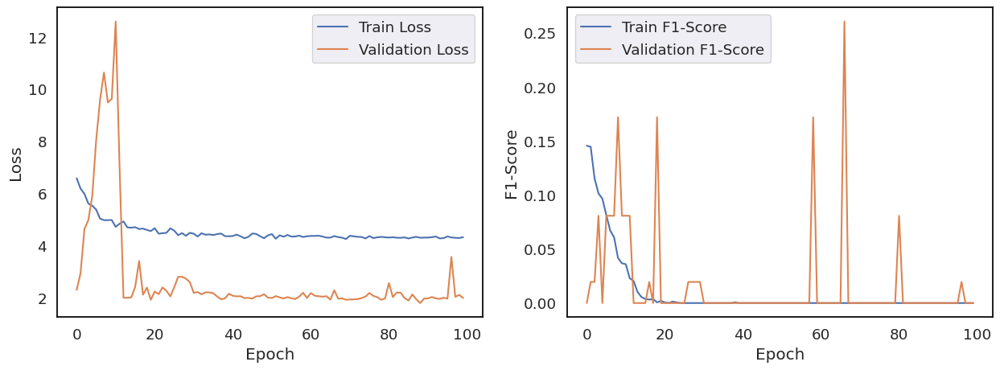

In [272]:
plot_learning_curve(history_aug.history['loss'], history_aug.history['val_loss'], history_aug.history['f1'], history_aug.history['val_f1'], "F1-Score" )

In [273]:
# Get the predicted labels for the test set
predictions_aug = shape_model_aug.predict(valX)
predicted_labels_aug = np.argmax(predictions_aug, axis=1)

# Convert one-hot encoded test labels back to integers
true_labels_aug = np.argmax(valY, axis=1)

# Generate classification report
report_aug = classification_report(true_labels_aug, predicted_labels_aug)
print(report_aug)



24/24 [==============================] - 1s 16ms/step
              precision    recall  f1-score   support

           0       0.07      1.00      0.14        55
           1       0.00      0.00      0.00         8
           2       0.00      0.00      0.00       359
           3       0.00      0.00      0.00       132
           4       0.00      0.00      0.00       186

    accuracy                           0.07       740
   macro avg       0.01      0.20      0.03       740
weighted avg       0.01      0.07      0.01       740



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [277]:
# Convert the predicted values to a multi-label indicator matrix
predicted_labels_multilabel_3 = to_categorical(predicted_labels_aug)

# Generate classification report
print(classification_report(true_labels_aug, predicted_labels_multilabel_aug, target_names=['diamond', 'hex', 'round', 'square', 'triangle']))

              precision    recall  f1-score   support

     diamond       0.00      0.00      0.00        55
         hex       0.01      1.00      0.02         8
       round       0.00      0.00      0.00       359
      square       0.00      0.00      0.00       132
    triangle       0.00      0.00      0.00       186

    accuracy                           0.01       740
   macro avg       0.00      0.20      0.00       740
weighted avg       0.00      0.01      0.00       740



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


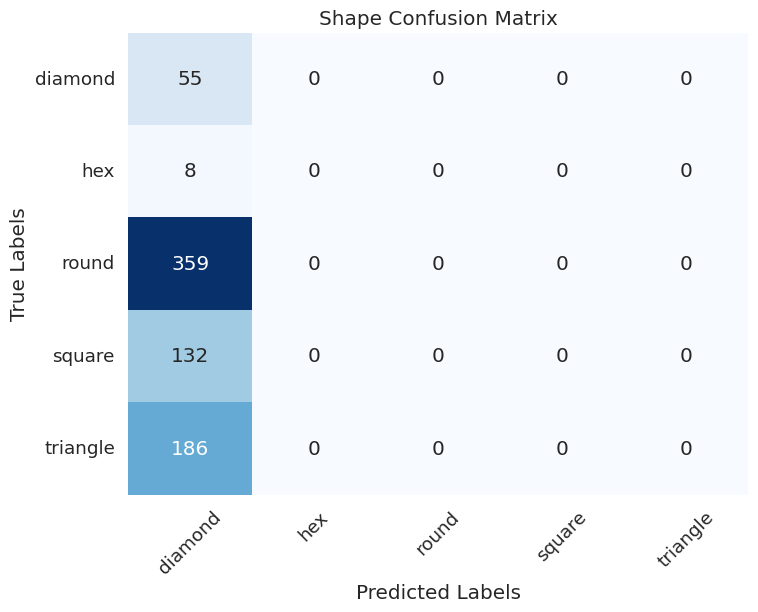

In [278]:
conf_matrix_shape_aug = confusion_matrix(true_labels_aug, predicted_labels_aug)
plot_confusion_matrix(conf_matrix_shape_aug, class_names=['diamond', 'hex', 'round', 'square', 'triangle'],
                      title='Shape Confusion Matrix')

# Test Model

In [237]:
df_test

,image name,hash,shape,type,encoded_shape,encoded_type
0,Testing/round/noentry/G_05304.png,6b4ca8e0c44516ed6351b28a35627b9e,round,noentry,2,6
1,Testing/round/noentry/B_00007_00001.png,6bd6e555c66c833f5ba627f8b4849406,round,noentry,2,6
2,Testing/round/noentry/G_04804.png,1a9409961836ef6ac904d0b5f395d8f8,round,noentry,2,6
3,Testing/round/noentry/G_02547.png,7a61e1455e42cf8b7615484b75bf5d65,round,noentry,2,6
4,Testing/round/noentry/G_06870.png,5b8e40d02c3b94b77cb2f76a38acd074,round,noentry,2,6
...,...,...,...,...,...,...
791,/content/drive/My Drive/COSC2673A2/images/Stop...,NaN,hex,stop,1,12
792,/content/drive/My Drive/COSC2673A2/images/Stop...,NaN,hex,stop,1,12
793,/content/drive/My Drive/COSC2673A2/images/Park...,NaN,square,parking,3,8
794,/content/drive/My Drive/COSC2673A2/images/Spee...,NaN,round,speed,2,11


In [279]:
(testX, testY) = load_split(df_test)

In [280]:
testX = testX.astype("float32") / 255.0

In [281]:
testX = testX.reshape(testX.shape[0], 28, 28, 1)

In [282]:
# Get the predicted labels for the test set
predictions = shape_model_2.predict(testX)
predicted_labels = np.argmax(predictions, axis=1)

# Convert one-hot encoded test labels back to integers
true_labels = testY

# Generate classification report
report = classification_report(true_labels, predicted_labels)
print(report)

25/25 [==============================] - 0s 16ms/step
              precision    recall  f1-score   support

           0       0.88      0.76      0.82        50
           1       1.00      0.76      0.87        55
           2       0.91      0.98      0.94       404
           3       0.97      0.73      0.83       187
           4       0.71      0.98      0.82       100

    accuracy                           0.89       796
   macro avg       0.90      0.84      0.86       796
weighted avg       0.90      0.89      0.89       796



In [287]:
# Convert the predicted values to a multi-label indicator matrix
predicted_labels_multilabel_final = to_categorical(predicted_labels)
testY_multilabel = to_categorical(testY)
# Generate classification report
print(classification_report(testY_multilabel , predicted_labels_multilabel_final, target_names=['diamond', 'hex', 'round', 'square', 'triangle']))

              precision    recall  f1-score   support

     diamond       0.88      0.76      0.82        50
         hex       1.00      0.76      0.87        55
       round       0.91      0.98      0.94       404
      square       0.97      0.73      0.83       187
    triangle       0.71      0.98      0.82       100

   micro avg       0.89      0.89      0.89       796
   macro avg       0.90      0.84      0.86       796
weighted avg       0.90      0.89      0.89       796
 samples avg       0.89      0.89      0.89       796



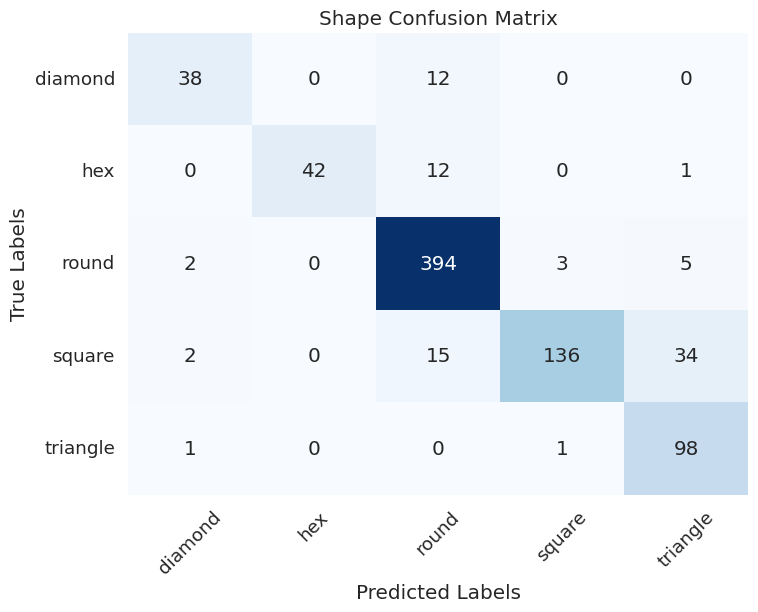

In [290]:
conf_matrix_shape_aug = confusion_matrix(true_labels, predicted_labels)
plot_confusion_matrix(conf_matrix_shape_aug, class_names=['diamond', 'hex', 'round', 'square', 'triangle'],
                      title='Shape Confusion Matrix')

In [288]:
# Evaluate the model on the test set
test_loss, test_accuracy = shape_model_2.evaluate(testX, testY_multilabel, verbose=1)

# Print the test loss and accuracy
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

25/25 [==============================] - 1s 28ms/step - loss: 0.8453 - f1: 0.8900
Test Loss: 0.8452922105789185
Test Accuracy: 0.8899945020675659


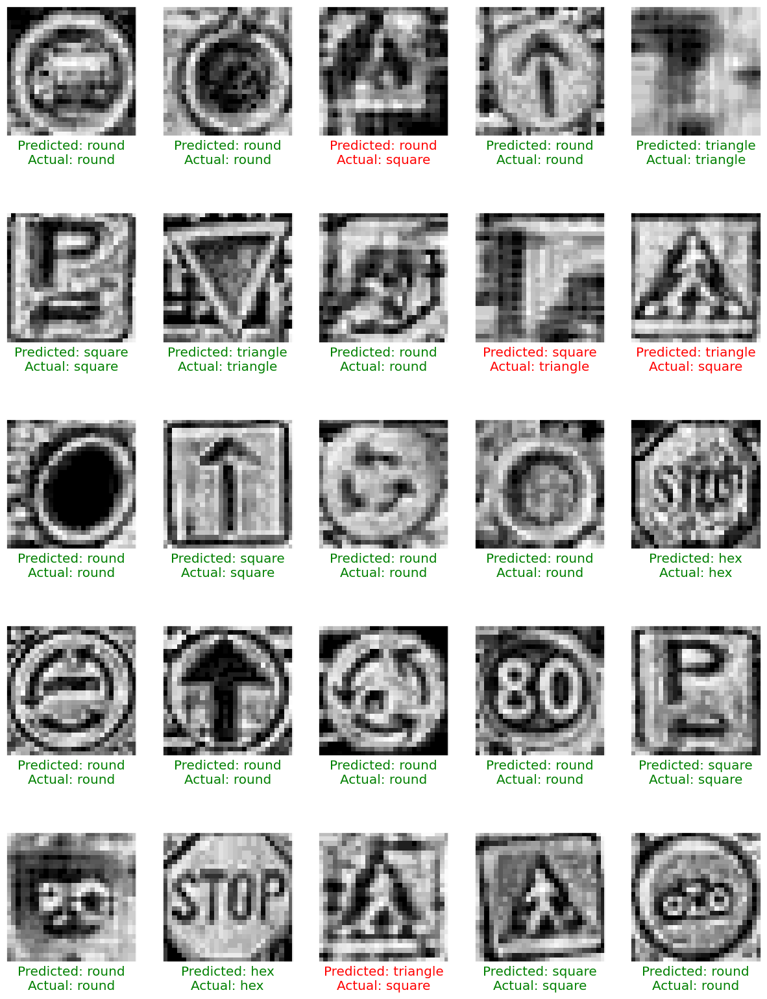

In [289]:
def show_images_with_predictions(images, true_labels, predicted_labels, class_names):
    plt.figure(figsize=(15, 20))
    for i in range(len(images)):
        plt.subplot(5, 5, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(images[i], cmap=plt.cm.binary)
        predicted_label = class_names[predicted_labels[i]]
        true_label = class_names[true_labels[i]]
        if predicted_label == true_label:
            color = 'green'
        else:
            color = 'red'
        plt.xlabel(f'Predicted: {predicted_label}\nActual: {true_label}', color=color)
    plt.show()

# Example usage:
show_images_with_predictions(testX[:25], true_labels[:25], predicted_labels[:25], class_names=['diamond', 'hex', 'round', 'square', 'triangle'])


# Type Model Refinement

### Baseline MLP model with Smote

In [ ]:
(X_train_sm, y_train_sm) = load_split(train_data_smote)
(X_val_sm, y_val_sm) = load_split(val_data_smote)

numLabels = 16
y_train_sm = to_categorical(y_train_sm, numLabels)
y_val_sm = to_categorical(y_val_sm, numLabels)

X_train_sm = X_train_sm.reshape(6751, 28, 28, 1)
X_val_sm = X_val_sm.reshape(1688, 28, 28, 1)

[INFO] processed 1000 total images
[INFO] processed 2000 total images
[INFO] processed 3000 total images
[INFO] processed 4000 total images
[INFO] processed 5000 total images
[INFO] processed 6000 total images
[INFO] processed 1000 total images


In [ ]:
type_list_smote = sorted(df_new['type'].unique())
# y_val_type_smote = val_data_smote['encoded_type']

In [ ]:
mlp_model_sm = tf.keras.Sequential([
      tf.keras.layers.Flatten(input_shape=(28, 28, 1)),
      tf.keras.layers.Dense(126, activation='relu'),
      tf.keras.layers.Dense(num_type_classes)
  ])

#Compile the model
mlp_model_sm.compile(optimizer='SGD',
                  loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
                  metrics=f1)
mlp_history_smote = mlp_model_sm.fit(X_train_sm, y_train_sm, validation_data = (X_val_sm, y_val_sm), epochs=25, verbose=0,callbacks=[callback])

In [ ]:
summary_history(mlp_history_smote)

Train F1 of the last epoch 0.3220277726650238
Train loss of last epoch 1.006085753440857
Val F1  of the last epoch  0.3107152581214905
Val loss of  of the last epoch 0.9680415391921997


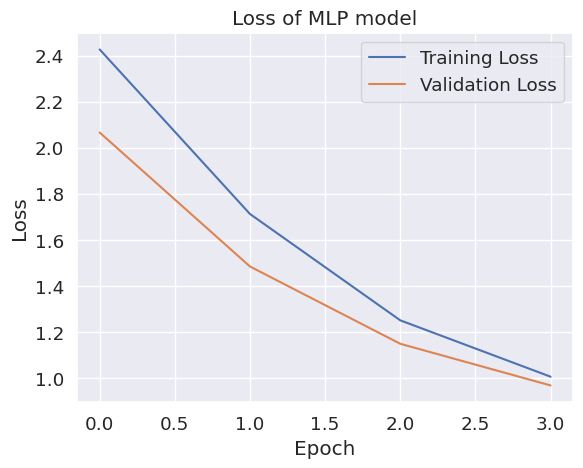

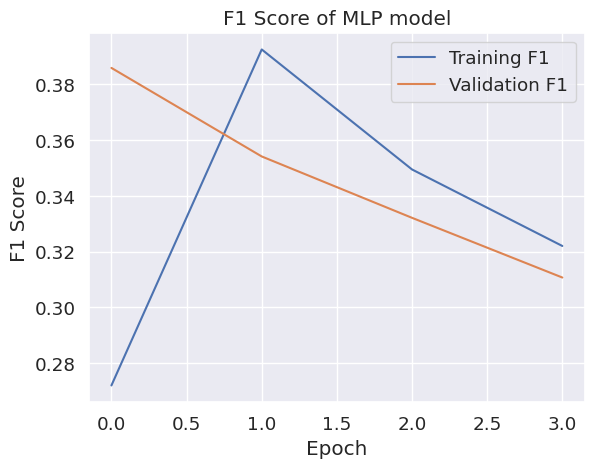

In [ ]:
plot_MLP_metrics(mlp_history_smote)

53/53 [==============================] - 0s 5ms/step
                  precision    recall  f1-score   support

         bicycle       0.86      0.97      0.91       118
        continue       0.94      0.77      0.84        99
        crossing       0.98      0.74      0.84        80
         giveway       0.87      0.84      0.86       116
         laneend       0.80      0.77      0.78        90
  limitedtraffic       0.61      0.54      0.57        92
         noentry       0.74      0.89      0.81       125
       noparking       0.74      0.69      0.72       117
         parking       0.93      0.93      0.93       122
      rightofway       0.83      0.85      0.84       118
      roundabout       0.88      0.83      0.85        84
           speed       0.85      0.95      0.90       123
            stop       0.92      0.59      0.72        81
trafficdirective       0.74      0.72      0.73        97
 traveldirection       0.55      0.74      0.63        89
         warning  

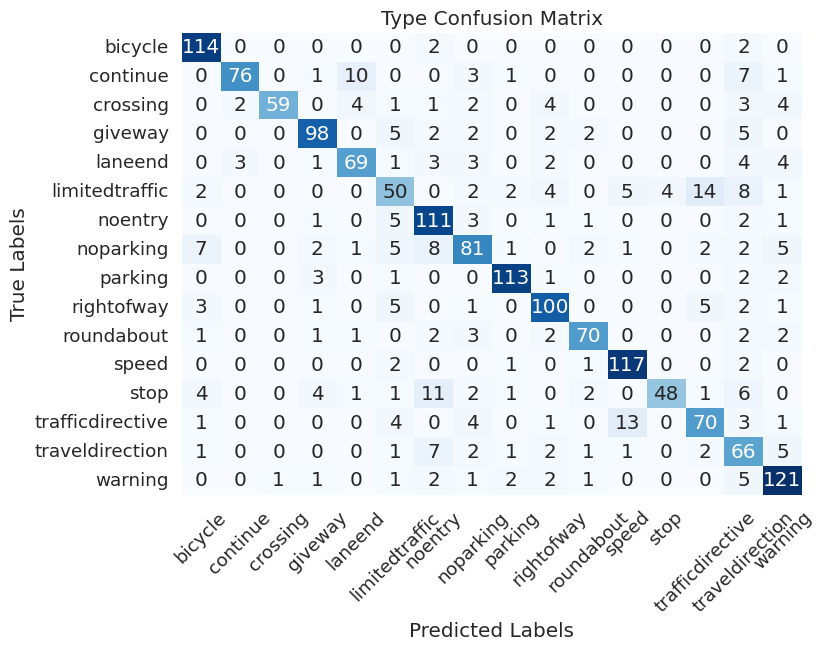

In [ ]:

predictions = mlp_model_sm.predict(X_val_sm)
predicted_sm = np.argmax(predictions, axis=1)
y_val_sm_true = np.argmax(y_val_sm, axis=1)
report = classification_report(y_val_sm_true, predicted_sm,target_names=type_list)
print(report)


conf_matrix_shape = confusion_matrix(y_val_sm_true, predicted_sm)
plot_confusion_matrix(conf_matrix_shape, class_names=type_list,
                      title='Type Confusion Matrix')

### Tune number of neurons in the single hidden layer

In [ ]:
!pip install keras-tuner

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 2.6 MB/s eta 0:00:00


In [ ]:
import keras_tuner as kt

def build_MLP_model(param):
  model = tf.keras.Sequential()
  model.add(tf.keras.layers.Flatten(input_shape=(28, 28, 1)))

  #Tune number of neurons
  param_units = param.Choice('units', [126,256,400,512])
  model.add(tf.keras.layers.Dense(units=param_units,
      activation='relu'))
  model.add(tf.keras.layers.Dense(num_type_classes))

  #Tune learning rates
  learning_rate = param.Choice('learning_rate', values=[1e-2, 1e-3])


  #Compile the model
  model.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=learning_rate),
                    loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
                    metrics=[f1])
  return model


tuner = kt.GridSearch(
    hypermodel=build_MLP_model,
    objective=kt.Objective("val_f1", direction="max"),
    executions_per_trial=1,
    overwrite=True,
    directory="my_dir",
    project_name="a2",
)

In [ ]:
tuner.search(X_train, y_train, epochs=25, validation_data=(X_val, y_val))

Trial 8 Complete [00h 00m 22s]
val_f1: 0.39563897252082825

Best val_f1 So Far: 0.5130332112312317
Total elapsed time: 00h 02m 47s


In [ ]:
tuner.results_summary()

Results summary
Results in my_dir/a2
Showing 10 best trials
Objective(name="val_f1", direction="max")

Trial 0002 summary
Hyperparameters:
units: 256
learning_rate: 0.01
Score: 0.5130332112312317

Trial 0000 summary
Hyperparameters:
units: 126
learning_rate: 0.01
Score: 0.46612563729286194

Trial 0003 summary
Hyperparameters:
units: 256
learning_rate: 0.001
Score: 0.4014029800891876

Trial 0007 summary
Hyperparameters:
units: 512
learning_rate: 0.001
Score: 0.39563897252082825

Trial 0004 summary
Hyperparameters:
units: 400
learning_rate: 0.01
Score: 0.38640475273132324

Trial 0006 summary
Hyperparameters:
units: 512
learning_rate: 0.01
Score: 0.29841500520706177

Trial 0005 summary
Hyperparameters:
units: 400
learning_rate: 0.001
Score: 0.2300061583518982

Trial 0001 summary
Hyperparameters:
units: 126
learning_rate: 0.001
Score: 0.20990657806396484


In [ ]:
best_params = tuner.get_best_hyperparameters(1)[0]
best_single_model = build_MLP_model(best_params)
sg_history = best_single_model.fit(X_train, y_train, epochs=25, validation_data=(X_val, y_val),
                                   callbacks=keras.callbacks.EarlyStopping(monitor='val_f1',patience=5))

Epoch 1/25
93/93 [==============================] - 1s 7ms/step - loss: 2.2991 - f1: 0.2971 - val_loss: 2.0365 - val_f1: 0.3931
Epoch 2/25
93/93 [==============================] - 0s 5ms/step - loss: 1.7606 - f1: 0.4155 - val_loss: 1.5884 - val_f1: 0.4148
Epoch 3/25
93/93 [==============================] - 0s 5ms/step - loss: 1.3697 - f1: 0.4650 - val_loss: 1.2883 - val_f1: 0.4380
Epoch 4/25
93/93 [==============================] - 0s 5ms/step - loss: 1.0969 - f1: 0.4634 - val_loss: 1.0715 - val_f1: 0.4696
Epoch 5/25
93/93 [==============================] - 0s 5ms/step - loss: 0.9117 - f1: 0.4533 - val_loss: 0.9412 - val_f1: 0.4126
Epoch 6/25
93/93 [==============================] - 0s 5ms/step - loss: 0.7796 - f1: 0.4277 - val_loss: 0.8216 - val_f1: 0.4129


Train F1 of the last epoch 0.42773327231407166
Train loss of last epoch 0.7795631289482117
Val F1  of the last epoch  0.4128507673740387
Val loss of  of the last epoch 0.8215715289115906


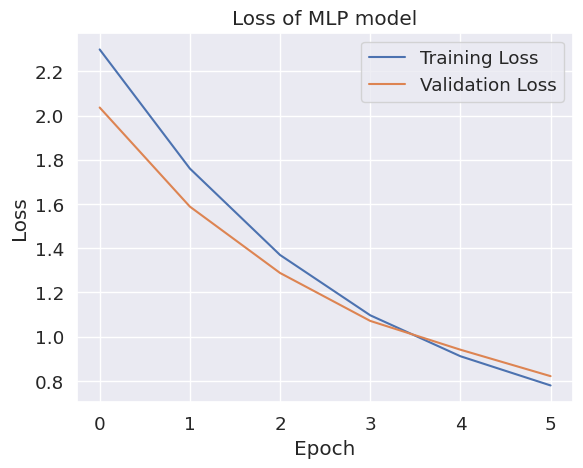

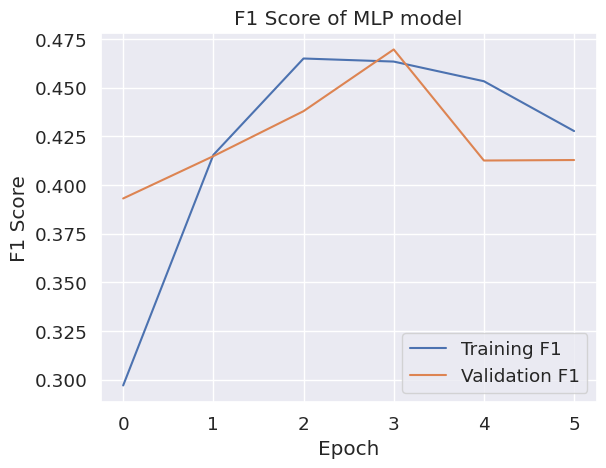

In [ ]:
summary_history(sg_history)
plot_MLP_metrics(sg_history)



 ### 2 layers model

In [ ]:
neurons_list = [248,400,512]

In [ ]:
import keras_tuner as kt

def build_MLP_model(param):
  model = tf.keras.Sequential()
  model.add(tf.keras.layers.Flatten(input_shape=(28, 28, 1)))

  #Tune number of neurons
  param_units1 = param.Choice('units1', neurons_list)
  model.add(tf.keras.layers.Dense(units=param_units1,
      activation='relu'))
  param_units2 = param.Choice('units2', neurons_list)
  model.add(tf.keras.layers.Dense(units=param_units2,
      activation='relu'))
  model.add(tf.keras.layers.Dense(num_type_classes))

  #Tune learning rates
  learning_rate = param.Choice('learning_rate', values=[1e-2, 1e-3])


  #Compile the model
  model.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=learning_rate),
                    loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
                    metrics=[f1])
  return model



In [ ]:
tuner = kt.GridSearch(
    hypermodel=build_MLP_model,
    objective=kt.Objective("val_f1", direction="max"),
    executions_per_trial=1,
    overwrite=True,
    directory="my_dir",
    project_name="a2",
)

tuner.search(X_train, y_train, epochs=25, validation_data=(X_val, y_val))

Trial 18 Complete [00h 00m 25s]
val_f1: 0.37084314227104187

Best val_f1 So Far: 0.5128965973854065
Total elapsed time: 00h 06m 29s


In [ ]:
tuner.results_summary()

Results summary
Results in my_dir/a2
Showing 10 best trials
Objective(name="val_f1", direction="max")

Trial 0006 summary
Hyperparameters:
units1: 400
units2: 248
learning_rate: 0.01
Score: 0.5128965973854065

Trial 0007 summary
Hyperparameters:
units1: 400
units2: 248
learning_rate: 0.001
Score: 0.4641392230987549

Trial 0014 summary
Hyperparameters:
units1: 512
units2: 400
learning_rate: 0.01
Score: 0.42558753490448

Trial 0009 summary
Hyperparameters:
units1: 400
units2: 400
learning_rate: 0.001
Score: 0.41341862082481384

Trial 0004 summary
Hyperparameters:
units1: 248
units2: 512
learning_rate: 0.01
Score: 0.4068398177623749

Trial 0003 summary
Hyperparameters:
units1: 248
units2: 400
learning_rate: 0.001
Score: 0.37886154651641846

Trial 0016 summary
Hyperparameters:
units1: 512
units2: 512
learning_rate: 0.01
Score: 0.3787654936313629

Trial 0017 summary
Hyperparameters:
units1: 512
units2: 512
learning_rate: 0.001
Score: 0.37084314227104187

Trial 0008 summary
Hyperparameters:


In [ ]:
best_params = tuner.get_best_hyperparameters(1)[0]
best_2_model = build_MLP_model(best_params)
best2_history = best_2_model.fit(X_train, y_train, epochs=25, validation_data=(X_val, y_val),callbacks=[callback])

Epoch 1/25
93/93 [==============================] - 4s 24ms/step - loss: 2.3314 - f1: 0.2732 - val_loss: 2.0793 - val_f1: 0.3203
Epoch 2/25
93/93 [==============================] - 1s 12ms/step - loss: 1.7259 - f1: 0.3944 - val_loss: 1.5589 - val_f1: 0.3458
Epoch 3/25
93/93 [==============================] - 1s 14ms/step - loss: 1.2583 - f1: 0.4217 - val_loss: 1.2154 - val_f1: 0.3714
Epoch 4/25
93/93 [==============================] - 1s 12ms/step - loss: 0.9457 - f1: 0.4016 - val_loss: 1.0155 - val_f1: 0.3574


Train F1 of the last epoch 0.4015975594520569
Train loss of last epoch 0.945659875869751
Val F1  of the last epoch  0.35737523436546326
Val loss of  of the last epoch 1.015519618988037


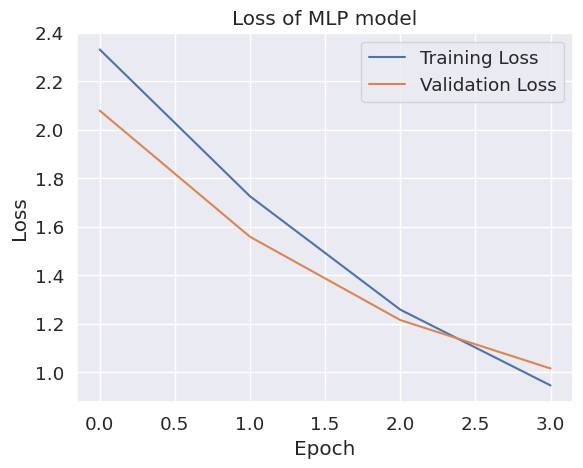

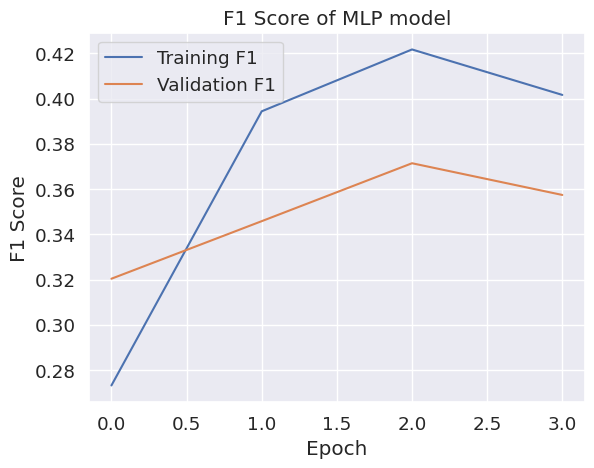

In [ ]:
summary_history(best2_history)
plot_MLP_metrics(best2_history)

#### Regularisation

In [ ]:
reg = [0.01,0.001]


def build_MLP_model(param):
  model = tf.keras.Sequential()
  model.add(tf.keras.layers.Flatten(input_shape=(28, 28, 1)))

  reg1 = param.Choice('reg1', reg)
  reg2 = param.Choice('reg2', reg)

  param_units1 = param.Choice('units1', neurons_list)
  param_units2 = param.Choice('units2', neurons_list)

  #Use best model from previous section
  model.add(tf.keras.layers.Dense(units=param_units1,
      activation='relu',
      kernel_regularizer=regularizers.l2(reg1)))
  model.add(tf.keras.layers.Dense(units=param_units2,
      activation='relu',
            kernel_regularizer=regularizers.l2(reg2)))
  model.add(tf.keras.layers.Dense(num_type_classes))



  #Compile the model
  model.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=0.01),
                    loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
                    metrics=[f1])
  return model

tuner = kt.GridSearch(
    hypermodel=build_MLP_model,
    objective=kt.Objective("val_f1", direction="max"),
    executions_per_trial=1,
    overwrite=True,
    directory="my_dir",
    project_name="a2",
)

tuner.search(X_train, y_train, epochs=25, validation_data=(X_val, y_val))

Trial 36 Complete [00h 00m 43s]
val_f1: 0.34353816509246826

Best val_f1 So Far: 0.44921520352363586
Total elapsed time: 00h 19m 24s


In [ ]:
tuner.results_summary()

Results summary
Results in my_dir/a2
Showing 10 best trials
Objective(name="val_f1", direction="max")

Trial 0014 summary
Hyperparameters:
reg1: 0.01
reg2: 0.001
units1: 400
units2: 512
Score: 0.44921520352363586

Trial 0018 summary
Hyperparameters:
reg1: 0.001
reg2: 0.01
units1: 248
units2: 248
Score: 0.4472787082195282

Trial 0020 summary
Hyperparameters:
reg1: 0.001
reg2: 0.01
units1: 248
units2: 512
Score: 0.43115416169166565

Trial 0023 summary
Hyperparameters:
reg1: 0.001
reg2: 0.01
units1: 400
units2: 512
Score: 0.42734041810035706

Trial 0007 summary
Hyperparameters:
reg1: 0.01
reg2: 0.01
units1: 512
units2: 400
Score: 0.41303423047065735

Trial 0016 summary
Hyperparameters:
reg1: 0.01
reg2: 0.001
units1: 512
units2: 400
Score: 0.4052242040634155

Trial 0009 summary
Hyperparameters:
reg1: 0.01
reg2: 0.001
units1: 248
units2: 248
Score: 0.4009096622467041

Trial 0022 summary
Hyperparameters:
reg1: 0.001
reg2: 0.01
units1: 400
units2: 400
Score: 0.39737918972969055

Trial 0000 su

In [ ]:
best_params = tuner.get_best_hyperparameters(1)[0]
best_2t_model = build_MLP_model(best_params)
best2t_history = best_2t_model.fit(X_train, y_train, epochs=25, validation_data=(X_val, y_val),
                                   callbacks=keras.callbacks.EarlyStopping(monitor='val_f1',patience=3))

Epoch 1/25
93/93 [==============================] - 3s 19ms/step - loss: 8.0267 - f1: 0.2595 - val_loss: 7.6805 - val_f1: 0.3219
Epoch 2/25
93/93 [==============================] - 1s 14ms/step - loss: 7.3120 - f1: 0.3590 - val_loss: 7.0448 - val_f1: 0.3390
Epoch 3/25
93/93 [==============================] - 1s 14ms/step - loss: 6.6699 - f1: 0.3713 - val_loss: 6.4845 - val_f1: 0.3535
Epoch 4/25
93/93 [==============================] - 1s 14ms/step - loss: 6.1793 - f1: 0.3557 - val_loss: 6.0807 - val_f1: 0.3225


Train F1 of the last epoch 0.3556666076183319
Train loss of last epoch 6.179316997528076
Val F1  of the last epoch  0.32251718640327454
Val loss of  of the last epoch 6.080674171447754


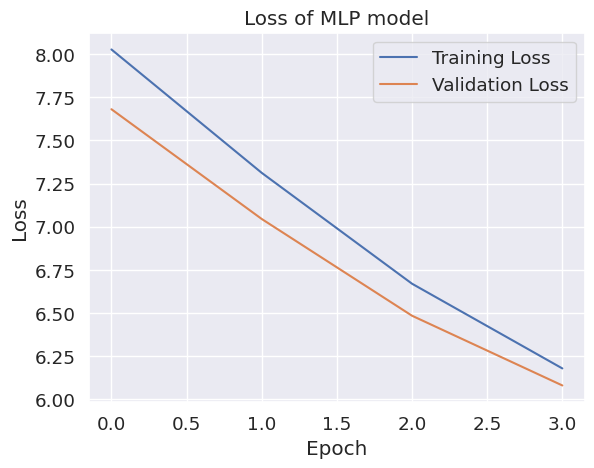

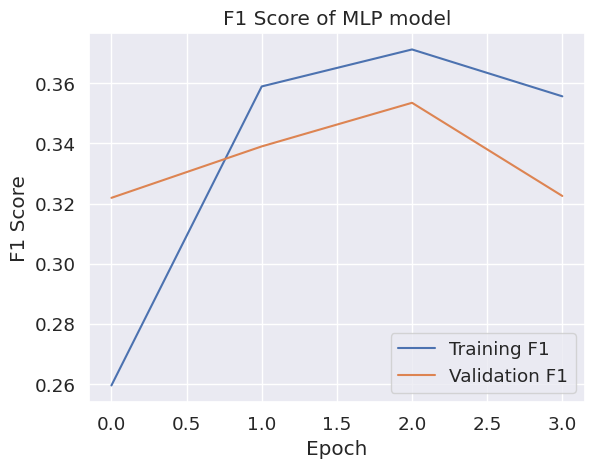

In [ ]:
summary_history(best2t_history)
plot_MLP_metrics(best2t_history)

### Data Augmentation

In [ ]:
from keras.preprocessing.image import array_to_img, img_to_array, load_img

#Define a function that apply data augmentation on a random image from the training set
def apply_aug(sample_image,datagen):
  # Test-apply the train ImageDataGenerator on an image to see how data augmentation is applied
  imgpath,sign_shape,sign_type = sample_image
  img = load_img(imgpath)
  x = img_to_array(img)  # this is a Numpy array with shape (3, 150, 150)
  x = x.reshape((1,) + x.shape)
  aug_iter = datagen.flow(x, batch_size=1)

  # generate samples and plot
  fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(10,10))

  # generate batch of images
  for i in range(1,5):
    #Show original image and its labels
    ogimg = Image.open(imgpath)
    ax[0].imshow(ogimg)
    ax[0].set_title(" ".join(["Original image:\n",sign_shape,sign_type]))

    #Show randomly augmented images from the original image
    image = next(aug_iter)[0] * 255
    image = image.astype('uint8')
    # plot image
    ax[i].imshow(image)
    ax[i].axis('off')

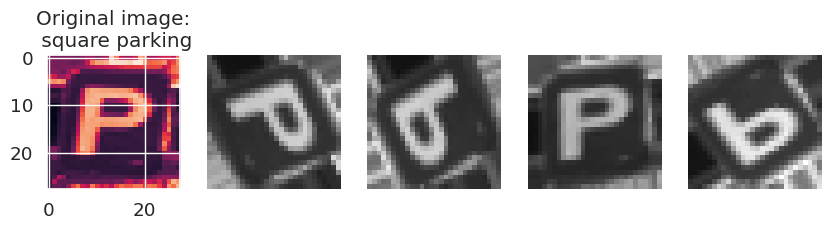

In [ ]:


train_datagen2 = ImageDataGenerator(rescale=1./255,
                                    data_format='channels_last',
                                    rotation_range=90,
                                    brightness_range=[0.8,1.3],
                                    vertical_flip=True,
                                    )

val_datagen2 = ImageDataGenerator(rescale=1./255,
                                  data_format='channels_last')

sample_image = train_data_smote.iloc[2000,0:3]
apply_aug(sample_image,train_datagen2)

In [ ]:
aug_model = tf.keras.Sequential()
aug_model.add(tf.keras.layers.Flatten(input_shape=(28, 28, 3)))

aug_model.add(tf.keras.layers.Dense(units=256,
    activation='relu'))
aug_model.add(tf.keras.layers.Dense(num_type_classes))


#Compile the model
aug_model.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=0.01),
                loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
                metrics=f1)

Found 2959 validated image filenames belonging to 16 classes.
Found 740 validated image filenames belonging to 16 classes.


<ipython-input-439-23809b5be076>:20: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = aug_model.fit_generator(train_generator, validation_data = validation_generator,


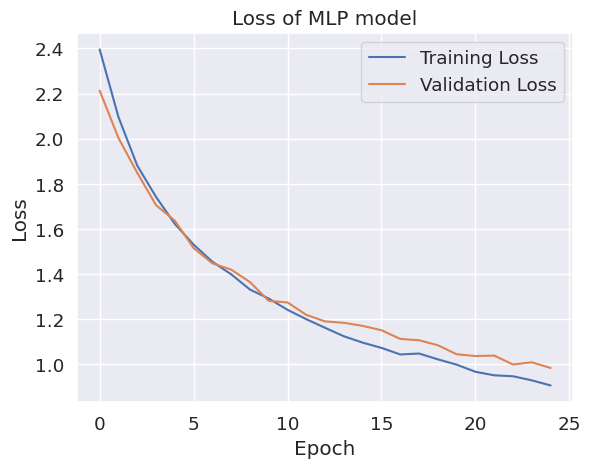

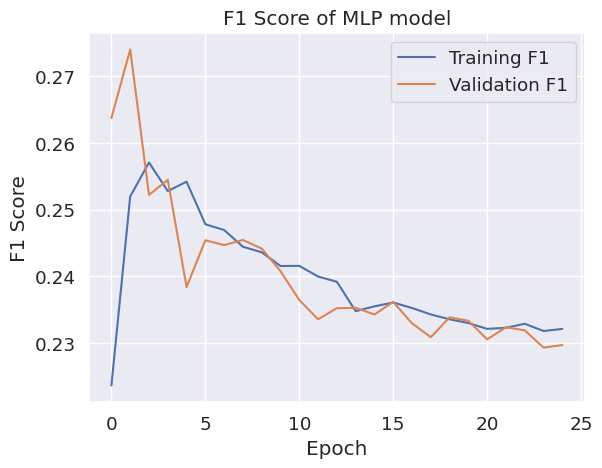

In [ ]:


batch_size = 32
train_generator = train_datagen2.flow_from_dataframe(
        dataframe=train_data,
        directory='./',
        x_col="image name",
        y_col="type",
        target_size=(28, 28),
        batch_size=batch_size,
        class_mode='categorical')

validation_generator = val_datagen2.flow_from_dataframe(
        dataframe=val_data,
        directory='./',
        x_col="image name",
        y_col="type",
        target_size=(28, 28),
        batch_size=batch_size,
        class_mode='categorical')

history = aug_model.fit_generator(train_generator, validation_data = validation_generator,
                              epochs=25, verbose=0)
plot_MLP_metrics(history)

In [ ]:
summary_history(history)

Train F1 of the last epoch 0.2321198433637619
Train loss of last epoch 0.9069669246673584
Val F1  of the last epoch  0.22970302402973175
Val loss of  of the last epoch 0.9842337369918823


# Apply model on Sign Type classification

In [ ]:
from keras import backend as K

def f1(y_true, y_pred):
    def recall(y_true, y_pred):
        true_pos = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        possible_pos = K.sum(K.round(K.clip(y_true, 0, 1)))
        recall = true_pos / (possible_pos + K.epsilon())
        return recall

    def precision(y_true, y_pred):
        true_pos = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_pos = K.sum(K.round(K.clip(y_pred, 0, 1)))
        precision = true_pos / (predicted_pos + K.epsilon())
        return precision
    precision = precision(y_true, y_pred)
    recall = recall(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))


## stuff


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Dense


from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import classification_report
from skimage import transform
from skimage import exposure
from skimage import io
import matplotlib.pyplot as plt
import numpy as np
import argparse
import random
import os

In [ ]:
inputShape = (28, 28, 1)
classes = 16
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers


chanDim = -1

# Create the model
model = Sequential([
    layers.Conv2D(16, (3, 3), padding="same"),
    layers.Activation("relu"),
    layers.BatchNormalization(axis=chanDim),
    layers.Conv2D(16, (3, 3), padding="same"),
    layers.Activation("relu"),
    layers.BatchNormalization(axis=chanDim),
    layers.MaxPooling2D(pool_size=(2, 2)),
    layers.Conv2D(32, (3, 3), padding="same"),
    layers.Activation("relu"),
    layers.BatchNormalization(axis=chanDim),
    layers.Conv2D(32, (3, 3), padding="same"),
    layers.Activation("relu"),
    layers.BatchNormalization(axis=chanDim),
    layers.MaxPooling2D(pool_size=(2, 2)),
    layers.Flatten(),
    layers.Dense(128),
    layers.Activation("relu"),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Flatten(),
    layers.Dense(128),
    layers.Activation("relu"),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(classes),
    layers.Activation("softmax")
])


In [ ]:
import os
import random
import numpy as np
from skimage import io, transform, exposure

def load_split(dataframe):
    data = []
    labels = []

    # Shuffle dataframe rows
    dataframe = dataframe.sample(frac=1).reset_index(drop=True)

    for i, row in dataframe.iterrows():
        # Progress update
        if i > 0 and i % 1000 == 0:
            print("[INFO] processed {} total images".format(i))

        # Extract image path and label from dataframe row
        imagePath = row['image name']
        label = row['encoded_type']

        # Load and preprocess image
        image = io.imread(imagePath)
        image = transform.resize(image, (28, 28))
        image = exposure.equalize_adapthist(image, clip_limit=0.1)

        # Update data and labels lists
        data.append(image)
        labels.append(int(label))

    # Convert lists to NumPy arrays
    data = np.array(data)
    labels = np.array(labels)

    # Return data and labels as a tuple
    return data, labels


In [ ]:
(dataX, dataY) = load_split(df_train)


[INFO] processed 1000 total images
[INFO] processed 2000 total images
[INFO] processed 3000 total images


In [ ]:
from sklearn.model_selection import train_test_split

# Split data into 80% training and 20% validation
trainX, valX, trainY, valY = train_test_split(dataX, dataY, test_size=0.2, random_state=42)

# Print the shapes of the resulting arrays
print("Training data shapes:", trainX.shape, trainY.shape)
print("Validation data shapes:", valX.shape, valY.shape)


Training data shapes: (2959, 28, 28) (2959,)
Validation data shapes: (740, 28, 28) (740,)


In [ ]:
numLabels = len(np.unique(trainY))
numLabels

16

In [ ]:
# scale data to the range of [0, 1]
trainX = trainX.astype("float32") / 255.0
valX = valX.astype("float32") / 255.0

In [ ]:
numLabels = len(np.unique(trainY))
trainY = to_categorical(trainY, numLabels)
valY = to_categorical(valY, numLabels)

In [ ]:
trainY

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 1.]], dtype=float32)

In [ ]:
# initialize a dictionary to store the class weights
classTotals = trainY.sum(axis=0)
classWeight = dict()
# loop over all classes and calculate the class weight
for i in range(0, len(classTotals)):
	classWeight[i] = classTotals.max() / classTotals[i]

In [ ]:
print(classWeight)

{0: 2.426087, 1: 3.4658384, 2: 7.44, 3: 2.9214659, 4: 5.93617, 5: 5.470588, 6: 1.8355263, 7: 3.0326087, 8: 2.735294, 9: 2.4910715, 10: 7.1538463, 11: 2.1882353, 12: 13.609756, 13: 3.55414, 14: 5.5247526, 15: 1.0}


In [ ]:
# construct the image generator for data augmentation
aug = ImageDataGenerator(
	rotation_range=10,
	zoom_range=0.15,
	width_shift_range=0.1,
	height_shift_range=0.1,
	shear_range=0.15,
	horizontal_flip=False,
	vertical_flip=False,
	fill_mode="nearest")
# initialize the optimizer and compile the model
print("[INFO] compiling model...")
# opt = Adam(lr=INIT_LR, decay=INIT_LR / (NUM_EPOCHS * 0.5))

[INFO] compiling model...


In [ ]:
NUM_EPOCHS = 30
INIT_LR = 1e-3
BS = 64
opt = Adam(learning_rate=INIT_LR)

# Compile the model
model.compile(loss="categorical_crossentropy", optimizer=opt, metrics=[f1])

In [ ]:
trainX = trainX.reshape(2959, 28, 28, 1)
valX = valX.reshape(740, 28, 28, 1)


In [ ]:
NUM_EPOCHS = 30
INIT_LR = 1e-3
BS = 64

# Train the network
print("[INFO] training network...")
H = model.fit(
    trainX, trainY,
    validation_data=(valX, valY),
    batch_size=BS,
    epochs=NUM_EPOCHS,
    class_weight=classWeight,
    verbose=1
)

[INFO] training network...
Epoch 1/30
47/47 [==============================] - 12s 165ms/step - loss: 7.3296 - f1: 0.2772 - val_loss: 3.0897 - val_f1: 0.0000e+00
Epoch 2/30
47/47 [==============================] - 9s 201ms/step - loss: 2.9373 - f1: 0.6524 - val_loss: 4.0420 - val_f1: 0.0786
Epoch 3/30
47/47 [==============================] - 7s 138ms/step - loss: 1.7735 - f1: 0.8036 - val_loss: 4.7402 - val_f1: 0.0786
Epoch 4/30
47/47 [==============================] - 7s 159ms/step - loss: 1.3253 - f1: 0.8615 - val_loss: 5.7761 - val_f1: 0.0786
Epoch 5/30
47/47 [==============================] - 7s 155ms/step - loss: 0.9414 - f1: 0.9005 - val_loss: 6.6362 - val_f1: 0.0786
Epoch 6/30
47/47 [==============================] - 6s 137ms/step - loss: 0.6833 - f1: 0.9348 - val_loss: 7.4765 - val_f1: 0.0789
Epoch 7/30
47/47 [==============================] - 10s 222ms/step - loss: 0.5897 - f1: 0.9446 - val_loss: 7.6744 - val_f1: 0.0786
Epoch 8/30
47/47 [==============================] - 6s 13

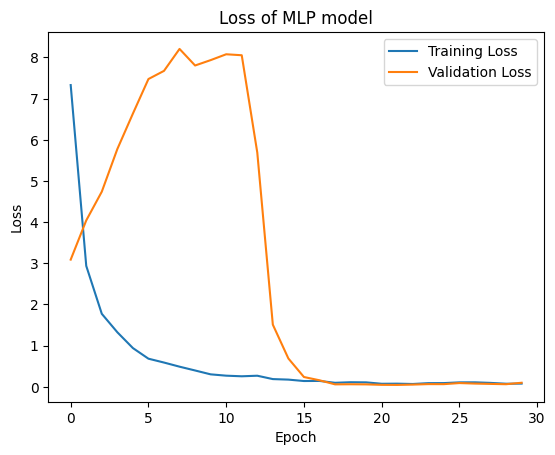

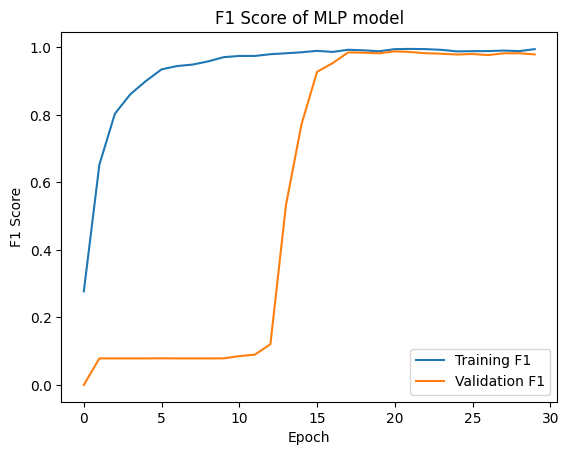

In [ ]:
plot_metrics(H)

In [ ]:
type_list = sorted(train_data['type'].unique())
type_list

['bicycle',
 'continue',
 'crossing',
 'giveway',
 'laneend',
 'limitedtraffic',
 'noentry',
 'noparking',
 'parking',
 'rightofway',
 'roundabout',
 'speed',
 'stop',
 'trafficdirective',
 'traveldirection',
 'warning']

In [ ]:
predictions = model.predict(valX)
predicted_labels = np.argmax(predictions, axis=1)


24/24 [==============================] - 1s 18ms/step


In [ ]:
from tensorflow.keras.utils import to_categorical

# Convert the predicted values to a multi-label indicator matrix
predicted_labels_multilabel = to_categorical(predicted_labels)

# Generate classification report
print(classification_report(valY, predicted_labels_multilabel, target_names=type_list))

                  precision    recall  f1-score   support

         bicycle       0.98      1.00      0.99        55
        continue       1.00      1.00      1.00        38
        crossing       1.00      1.00      1.00        20
         giveway       1.00      1.00      1.00        40
         laneend       1.00      0.92      0.96        24
  limitedtraffic       0.82      1.00      0.90        23
         noentry       0.99      0.94      0.96        71
       noparking       0.93      0.98      0.96        58
         parking       1.00      0.93      0.96        72
      rightofway       1.00      1.00      1.00        58
      roundabout       1.00      1.00      1.00        20
           speed       1.00      1.00      1.00        61
            stop       1.00      1.00      1.00         2
trafficdirective       1.00      0.97      0.99        38
 traveldirection       1.00      0.83      0.90        23
         warning       0.96      1.00      0.98       137

       micro

In [ ]:
model.save("model")

In [ ]:
!cp -R ./model /content/drive/'My Drive'/COSC2673A2/

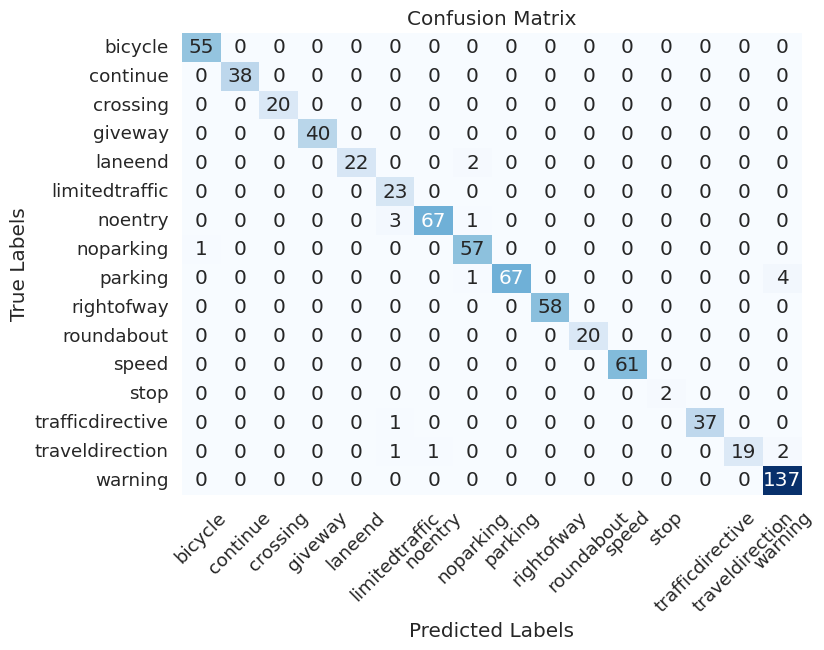

In [ ]:
from sklearn.metrics import confusion_matrix
true_labels = np.argmax(valY, axis=1)
conf_matrix_shape = confusion_matrix(true_labels, predicted_labels)
plot_confusion_matrix(conf_matrix_shape, class_names=type_list,
                      title='Confusion Matrix')

### Hyperparameter Tuning

In [ ]:

kernel_reg_list =  [0.01, 0.001]

def model_builder(param):

  #Tune dropout rate
  reg1 = param.Choice('reg1', kernel_reg_list)
  reg2 = param.Choice('reg2', kernel_reg_list)
  reg3 = param.Choice('reg3', kernel_reg_list)
  reg4 = param.Choice('reg4', kernel_reg_list)


  chanDim = -1

  # Create the model
  model = Sequential([
    layers.Conv2D(16, (3, 3), padding="same", kernel_regularizer=regularizers.l2(reg1)),
    layers.Activation("relu"),
    layers.BatchNormalization(axis=chanDim),
    layers.Conv2D(16, (3, 3), padding="same", kernel_regularizer=regularizers.l2(reg2)),
    layers.Activation("relu"),
    layers.BatchNormalization(axis=chanDim),
    layers.MaxPooling2D(pool_size=(2, 2)),
    layers.Dropout(0.25),  # Add dropout layer
    layers.Conv2D(32, (3, 3), padding="same", kernel_regularizer=regularizers.l2(reg3)),
    layers.Activation("relu"),
    layers.BatchNormalization(axis=chanDim),
    layers.Conv2D(32, (3, 3), padding="same", kernel_regularizer=regularizers.l2(reg4)),
    layers.Activation("relu"),
    layers.BatchNormalization(axis=chanDim),
    layers.MaxPooling2D(pool_size=(2, 2)),
    layers.Dropout(0.25),  # Add dropout layer
    layers.Flatten(),
    layers.Dense(128, kernel_regularizer=regularizers.l2(0.01)),
    layers.Activation("relu"),
    layers.BatchNormalization(),
    layers.Dropout(0.5),  # Add dropout layer
    layers.Dense(128, kernel_regularizer=regularizers.l2(0.01)),
    layers.Activation("relu"),
    layers.BatchNormalization(),
    layers.Dropout(0.5),  # Add dropout layer
    layers.Dense(classes),
    layers.Activation("softmax")
  ])


  model.compile(optimizer='SGD',
                    loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
                    metrics=[f1])
  return model


In [ ]:
pip install keras-tuner

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 1.2 MB/s eta 0:00:00


In [ ]:
import keras_tuner as kt

tuner = kt.GridSearch(
    hypermodel=model_builder,
    objective=kt.Objective("val_f1", direction="max"),
    executions_per_trial=1,
    overwrite=True,
    directory="my_dir",
    project_name="a2",
)

tuner.search(trainX, trainY, epochs=25, validation_data=(valX, valY))

Trial 16 Complete [00h 03m 34s]
val_f1: 0.9748206734657288

Best val_f1 So Far: 0.9806621074676514
Total elapsed time: 01h 02m 02s


In [ ]:
tuner.results_summary()

Results summary
Results in my_dir/a2
Showing 10 best trials
Objective(name="val_f1", direction="max")

Trial 0005 summary
Hyperparameters:
reg1: 0.01
reg2: 0.001
reg3: 0.01
reg4: 0.001
Score: 0.9806621074676514

Trial 0002 summary
Hyperparameters:
reg1: 0.01
reg2: 0.01
reg3: 0.001
reg4: 0.01
Score: 0.9800934195518494

Trial 0008 summary
Hyperparameters:
reg1: 0.001
reg2: 0.01
reg3: 0.01
reg4: 0.01
Score: 0.9782759547233582

Trial 0011 summary
Hyperparameters:
reg1: 0.001
reg2: 0.01
reg3: 0.001
reg4: 0.001
Score: 0.9774461388587952

Trial 0014 summary
Hyperparameters:
reg1: 0.001
reg2: 0.001
reg3: 0.001
reg4: 0.01
Score: 0.9762718677520752

Trial 0015 summary
Hyperparameters:
reg1: 0.001
reg2: 0.001
reg3: 0.001
reg4: 0.001
Score: 0.9748206734657288

Trial 0007 summary
Hyperparameters:
reg1: 0.01
reg2: 0.001
reg3: 0.001
reg4: 0.001
Score: 0.9737675786018372

Trial 0010 summary
Hyperparameters:
reg1: 0.001
reg2: 0.01
reg3: 0.001
reg4: 0.01
Score: 0.9718969464302063

Trial 0013 summary
Hyp

# Test Model

In [ ]:
# import the necessary packages
from tensorflow.keras.models import load_model
from skimage import transform
from skimage import exposure
from skimage import io
from imutils import paths
import numpy as np
import argparse
import imutils
import random
import cv2
import os

In [ ]:
df_test

,image name,hash,shape,type,encoded_type
0,Testing/round/noentry/B_02411_00001.png,082f77ca70d03029d0f011946476fdcd,round,noentry,6
1,Testing/round/noentry/G_00154.png,6e6c6a883e6d82881fcc9672e38f6322,round,noentry,6
2,Testing/round/noentry/G_04154.png,df74a922f90d3ee8a9c7ccf17b2c6ae5,round,noentry,6
3,Testing/round/noentry/G_06355.png,ad15a6ebbcfc271b03557a498843b04f,round,noentry,6
4,Testing/round/noentry/G_08112.png,1ecbd74f5faf18cd19765ffbe0ab1c4f,round,noentry,6
...,...,...,...,...,...
1541,/content/drive/My Drive/COSC2673A2/images/NoEn...,NaN,round,noentry,6
1542,/content/drive/My Drive/COSC2673A2/images/trav...,NaN,round,trafficdirective,13
1543,/content/drive/My Drive/COSC2673A2/images/NoEn...,NaN,round,noentry,6
1544,/content/drive/My Drive/COSC2673A2/images/Stop...,NaN,hex,stop,12


In [ ]:

df_test['image name'].values
# test_labels = df_test['encoded_shape_test'].values

array(['Testing/round/noentry/B_02411_00001.png',
       'Testing/round/noentry/G_00154.png',
       'Testing/round/noentry/G_04154.png', ...,
       '/content/drive/My Drive/COSC2673A2/images/NoEntry_2.png',
       '/content/drive/My Drive/COSC2673A2/images/Stop_1.png',
       '/content/drive/My Drive/COSC2673A2/images/Stop_2.png'],
      dtype=object)

In [ ]:
(testX, testY) = load_split(df_test)

[INFO] processed 1000 total images


In [ ]:
testX = testX.astype("float32") / 255.0

In [ ]:
testX = testX.reshape(testX.shape[0], 28, 28, 1)

In [ ]:
testX.shape

(1546, 28, 28, 1)

In [ ]:
print(f"Maximum value in testY: {np.max(testY)}")

Maximum value in testY: 15


In [ ]:
numLabels

16

In [ ]:
testY

array([14, 12, 12, ...,  9,  4, 10])

In [ ]:
numLabels = len(np.unique(testY))
print(numLabels)
testY = to_categorical(testY, 16)

16


In [ ]:
# initialize a dictionary to store the class weights
classTotals = testY.sum(axis=0)
classWeight = dict()
# loop over all classes and calculate the class weight
for i in range(0, len(classTotals)):
	classWeight[i] = classTotals.max() / classTotals[i]

In [ ]:
print(df_test["encoded_type"].unique())

[ 6 13 14 11 15 12  8  9  4 10  7  5  3  2  0  1]


In [ ]:
# image_rgb = tf.random.uniform(shape=(28, 28, 3), minval=0, maxval=256, dtype=tf.int32)

# # Convert the image to grayscale
# testX = tf.image.rgb_to_grayscale(testX)

In [ ]:
testX.shape

(1546, 28, 28, 1)

In [ ]:
testY.shape

(1546, 16)

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 28, 28, 16)        160       
                                                                 
 activation (Activation)     (None, 28, 28, 16)        0         
                                                                 
 batch_normalization (Batch  (None, 28, 28, 16)        64        
 Normalization)                                                  
                                                                 
 conv2d_7 (Conv2D)           (None, 28, 28, 16)        2320      
                                                                 
 activation_1 (Activation)   (None, 28, 28, 16)        0         
                                                                 
 batch_normalization_1 (Bat  (None, 28, 28, 16)        64        
 chNormalization)                                       

In [ ]:
# # Evaluate the model on the test set
# test_loss, test_accuracy = model.evaluate(testX, testY, verbose=1)

# # Print the test loss and accuracy
# print("Test Loss:", test_loss)
# print("Test Accuracy:", test_accuracy)

In [ ]:
# Get the predicted labels for the test set
predictions = best_model.predict(testX)
predicted_labels = np.argmax(predictions, axis=1)

# Convert one-hot encoded test labels back to integers
true_labels = np.argmax(testY, axis=1)

# Generate classification report
report = classification_report(true_labels, predicted_labels,target_names=type_list)
print(report)

49/49 [==============================] - 1s 29ms/step
                  precision    recall  f1-score   support

         bicycle       0.79      0.69      0.74       100
        continue       0.20      0.80      0.33        35
        crossing       1.00      0.06      0.11       100
         giveway       0.84      0.93      0.88       100
         laneend       0.98      0.43      0.60       100
  limitedtraffic       0.66      0.87      0.75       100
         noentry       0.78      0.88      0.83       102
       noparking       0.83      0.76      0.79       100
         parking       0.70      0.87      0.77       102
      rightofway       0.66      0.61      0.63       100
      roundabout       0.61      0.34      0.44       100
           speed       0.74      0.81      0.77       101
            stop       0.83      0.70      0.76       105
trafficdirective       0.80      0.81      0.80       101
 traveldirection       0.48      0.29      0.36       100
         warning 

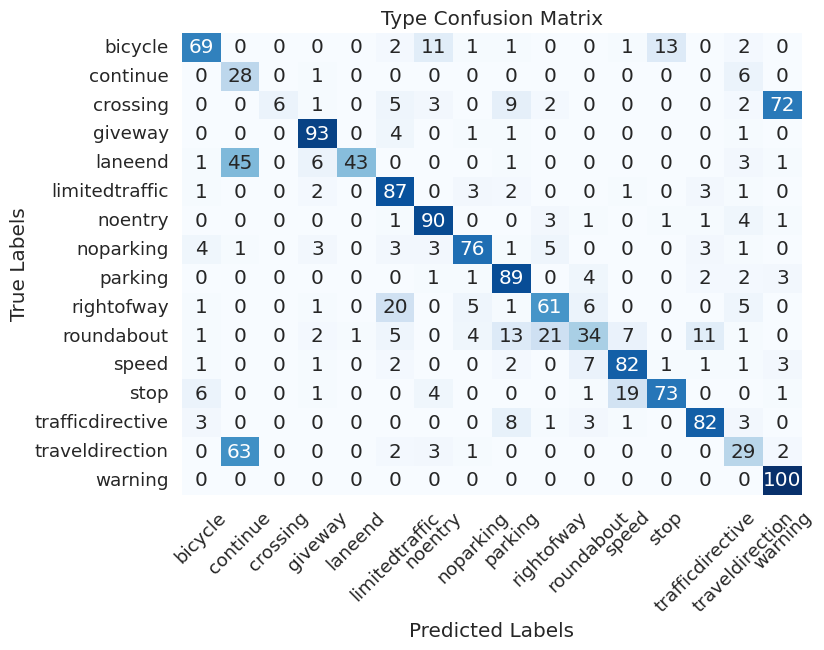

In [ ]:

conf_matrix_shape = confusion_matrix(true_labels, predicted_labels)
plot_confusion_matrix(conf_matrix_shape, class_names=type_list,
                      title='Type Confusion Matrix')

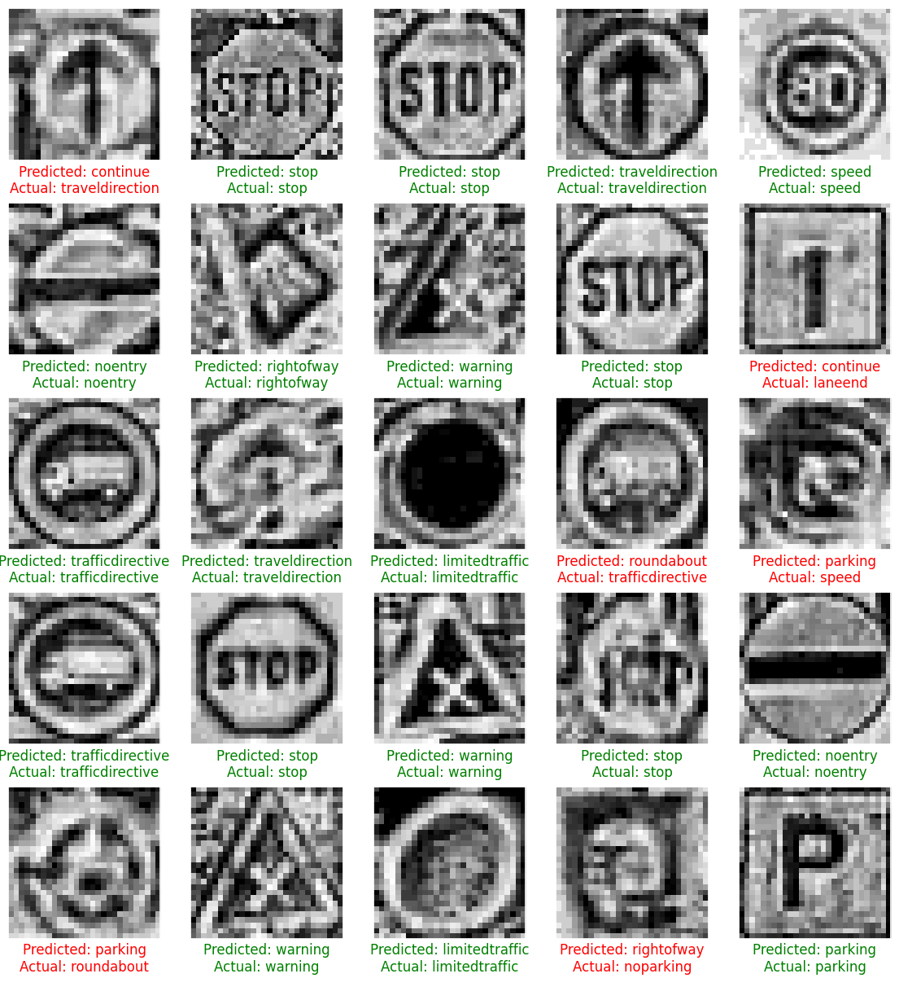

In [ ]:
import matplotlib.pyplot as plt

def show_images_with_predictions(images, true_labels, predicted_labels, class_names):
    plt.figure(figsize=(14, 15))
    for i in range(len(images)):
        plt.subplot(5, 5, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(images[i], cmap=plt.cm.binary)
        predicted_label = class_names[predicted_labels[i]]
        true_label = class_names[true_labels[i]]
        if predicted_label == true_label:
            color = 'green'
        else:
            color = 'red'
        plt.xlabel(f'Predicted: {predicted_label}\nActual: {true_label}\n', color=color,fontsize=12)
    plt.show()

# Example usage:
show_images_with_predictions(testX[:25], true_labels[:25], predicted_labels[:25], class_names=type_list)
